### Experiment :
### Objectives

1. Hyper paramet tuning
4. Train model with tuned parameterds for each embedding type

### Observations


### Solutions and further investigation

1. Do proper hyperparameter tuning for number of TCN filters, kernel , dilation
2. 
3. 

### Load Modeules and datasets

In [1]:
import numpy as np
import random as rn
np.random.seed(0)
rn.seed(0)
import pandas as pd
import matplotlib.pyplot as plt
pd.set_option('display.max_colwidth', 1000)
# import helper function script
import sys
sys.path.insert(1,'G:\\Github\\Sinhala-Hate-Speech-Detection')
import utills
import TextClassifier


Instructions for updating:
non-resource variables are not supported in the long term


In [2]:
import neptune
#import neptune.new as neptune
from neptunecontrib.monitoring.metrics import expand_prediction, log_class_metrics, log_binary_classification_metrics, log_classification_report,log_confusion_matrix,log_prediction_distribution
from neptunecontrib.api import log_table
from neptunecontrib.monitoring.keras import NeptuneMonitor
import neptunecontrib.monitoring.optuna as opt_utils 
import os
from dotenv import load_dotenv

load_dotenv()
NEPTUNE_PROJECT= os.getenv('NEPTUNE_PROJECT')
NEPTUNE_API_TOKEN = os.getenv(('NEPTUNE_API_TOKEN'))
neptune.init(project_qualified_name= NEPTUNE_PROJECT,api_token=NEPTUNE_API_TOKEN) 

# import neptune.new.integrations.optuna as optuna_utils

# neptune_callback = optuna_utils.NeptuneCallback(run)

Project(codekcg23/Research-Experiments)

#### Hyperparameter tuning

In [5]:
def create_model(trial,TC):

    from tcn import TCN, tcn_full_summary
    from tensorflow.python.keras.optimizer_v2.adam import Adam
    from tensorflow.python.keras.layers import Input, Embedding, Dense, Dropout, SpatialDropout1D
    from tensorflow.python.keras.layers import concatenate, GlobalAveragePooling1D, GlobalMaxPooling1D
    from tensorflow.python.keras.models import Model

    layer = trial.suggest_categorical("layers",[1,2,3])
    unit = trial.suggest_categorical("units",[64,128])
    dropout_rate = trial.suggest_categorical("dropout_rates",[0.1,0.2])
    kernel_size = trial.suggest_categorical("kernel_size",[3])
    activation = trial.suggest_categorical("activation", ["relu","swish",'tanh'])
    spatial_dropout =  trial.suggest_categorical("spatial_dropout",[True,False])
    lr =  trial.suggest_categorical("LR",[0.001,0.01])


    
    inp = Input( shape=(TC.MAX_SEQ_LEN,))
    if(TC.EMBEDDING == None):
        x = Embedding(output_dim=TC.EMBEDDING_SIZE, 
                        input_dim=TC.LEN_VOCAB, 
                        input_length=TC.MAX_SEQ_LEN,
                        #weights=[TC.emb_matrix], # Additionally we give the Wi
                        trainable=TC.trainable)(inp)
    else:
        x = Embedding(output_dim=TC.EMBEDDING_SIZE, 
                            input_dim=TC.LEN_VOCAB, 
                            input_length=TC.MAX_SEQ_LEN,
                            weights=[TC.emb_matrix], # Additionally we give the Wi
                            trainable=TC.trainable)(inp)
    if(spatial_dropout == True):    
        x = SpatialDropout1D(dropout_rate)(x)

    for i in range(layer):
        name = "tcn"+str(i)
        x = TCN(unit,dilations = [1, 2, 4],kernel_size=kernel_size, return_sequences=True, activation = activation, name =name)(x)
    #x = TCN(unit2,dilations = [1, 2, 4], kernel_size=kernel_size,return_sequences=True, activation = activation, name = 'tcn2')(x)
    
    avg_pool = GlobalAveragePooling1D()(x)
    max_pool = GlobalMaxPooling1D()(x)
    
    conc = concatenate([avg_pool, max_pool])
    conc = Dense(unit, activation=activation)(conc)
    conc = Dropout(dropout_rate)(conc)
    outp = Dense(1, activation="sigmoid")(conc)    

    model = Model(inputs=inp, outputs=outp)
    optimizer_adam = Adam(learning_rate=lr)
    model.compile(loss='binary_crossentropy',
                    optimizer=optimizer_adam,
                    metrics=['acc'])
    #model.compile( loss = 'binary_crossentropy', optimizer = 'adam', metrics = ['accuracy'])
    TC.model = model
    #tcn_full_summary(model)
    return model

In [6]:
import optuna
from optuna import trial
from optuna.integration import TFKerasPruningCallback
from tensorflow.python.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
def objective(trial):  # trial is object
    # from tensorflow.keras.callbacks import LearningRateScheduler
    # from tensorflow.keras.optimizers.schedules import ExponentialDecay
 
    model = create_model(trial,TC)
    # scheduler = ExponentialDecay(1e-3, 400*((len(train)*0.8)/BATCH_SIZE), 1e-5)
    # lr = LearningRateScheduler(scheduler, verbose=0)
    early_stopping = EarlyStopping(monitor='val_loss', min_delta=0.01, patience=5, verbose=1,mode='min',restore_best_weights=True)
    pruning = TFKerasPruningCallback(trial, "val_loss")
    lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3, min_lr=1e-5,mode='min', verbose=1)
    callbacks_list =[early_stopping,lr,pruning]
        # Fit the model on the training data.
        # The TFKerasPruningCallback checks for pruning condition every epoch.
    h=model.fit(
        TC.X_train,
        TC.Y_train,
        batch_size=TC.BATCH_SIZE,
        callbacks=callbacks_list,
        epochs=TC.EPOCHS,
        validation_split=0.1,
        shuffle=False, 
        verbose=2
    )
    #score = model.evaluate(TC_W.X_test, TC_W.Y_test, verbose=0)
    #return score[1]
    # print("train acc - ",h.history['acc']," val acc- ",h.history['val_acc'])
    # print("train loss - ",h.history['loss']," val loss- ",h.history['val_loss'])

    validation_loss = np.min(h.history['val_loss'])
                 
    return validation_loss
    # f1_score = model_performence(model)
    # return f1_score

In [7]:
def optune_study():
    N_TRIALS =50
    neptune.create_experiment("TCN")
    neptune.append_tag(['DL hyper-param',"TCN",TC.tag])
    neptune_callback = opt_utils.NeptuneCallback(
        # plots_update_freq=10,  # create/log plots every 10 trials
        # log_plot_slice=False,  # do not create/log plot_slice
        # log_plot_contour=False,  # do not create/log plot_contour
    )

    study = optuna.create_study(direction='minimize', sampler=optuna.samplers.TPESampler(seed=0), pruner=optuna.pruners.MedianPruner(n_warmup_steps=3))
    study.optimize(objective,n_trials=N_TRIALS,callbacks=[neptune_callback])  # number of trials
    opt_utils.log_study_info(study)
    # Log Optuna charts and study object after the sweep is complete
    # opt_utils.log_study_metadata(study,
    #                                 run,  
    #                                 log_plot_param_importances=True,
    #                                 log_plot_intermediate_values=True)
    
    
    return study

def optune_result(study):
    print("Study statistics: ")
    print("  Number of finished trials: ", len(study.trials))
    # print("  Number of pruned trials: ", len(pruned_trials))
    # print("  Number of complete trials: ", len(complete_trials))

    print("Best trial:")
    trial = study.best_trial

    print("  Value: ", trial.value)

    print("  Params: ")
    for key, value in trial.params.items():
        print("    {}: {}".format(key, value))
    trials_df = study.trials_dataframe()
    log_table("hyperparameter trials",trials_df)
    neptune.stop()
    display(trials_df)

##### Random embedding

In [ ]:
TC = TextClassifier.TextClassifier(EMBEDDING=None)

Load data

X train (4526,) Y train (4526,) X test (1940,) Y test (1940,)
dictionary size:  17577


In [ ]:
TC.EPOCHS =10
TC.BATCH_SIZE =16
TC.lr = 0.001
TC.tag = "TCN random emb"
TC.trainable = True

In [ ]:
study = optune_study()

https://app.neptune.ai/codekcg23/Research-Experiments/e/RES-574


[I 2022-03-17 00:37:53,523] A new study created in memory with name: no-name-c1527290-42be-4bcf-8f1b-7ca857df43b8


Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 48s - loss: 9064734.5109 - acc: 0.6027 - val_loss: 0.6574 - val_acc: 0.6689
Epoch 2/10
4073/4073 - 39s - loss: 0.8688 - acc: 0.6008 - val_loss: 0.8020 - val_acc: 0.3311
Epoch 3/10
4073/4073 - 36s - loss: 0.8772 - acc: 0.5983 - val_loss: 0.6744 - val_acc: 0.6689
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.010000000149011612.
4073/4073 - 37s - loss: 0.8515 - acc: 0.6148 - val_loss: 0.7037 - val_acc: 0.3311
Epoch 5/10
4073/4073 - 34s - loss: 0.7779 - acc: 0.6145 - val_loss: 0.6470 - val_acc: 0.6689
Epoch 6/10
4073/4073 - 36s - loss: 0.7599 - acc: 0.6202 - val_loss: 0.6360 - val_acc: 0.6689
Epoch 7/10
4073/4073 - 34s - loss: 0.7681 - acc: 0.6160 - val_loss: 0.6520 - val_acc: 0.6689
Epoch 8/10
4073/4073 - 35s - loss: 0.7613 - acc: 0.6111 - val_loss: 0.6639 - val_acc: 0.6689
Epoch 9/10

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0009999999776482583.
4073/4073 - 34s - loss: 0.7575 

[I 2022-03-17 00:44:03,839] Trial 0 finished with value: 0.6360464363171828 and parameters: {'layers': 2, 'units': 64, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'elu', 'spatial_dropout': False, 'LR': 0.1}. Best is trial 0 with value: 0.6360464363171828.


Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 39s - loss: 0.5238 - acc: 0.7594 - val_loss: 0.4557 - val_acc: 0.7925
Epoch 2/10
4073/4073 - 38s - loss: 0.1927 - acc: 0.9249 - val_loss: 0.5357 - val_acc: 0.7903
Epoch 3/10
4073/4073 - 38s - loss: 0.0638 - acc: 0.9811 - val_loss: 0.5903 - val_acc: 0.7792
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 38s - loss: 0.0310 - acc: 0.9914 - val_loss: 0.7080 - val_acc: 0.7638
Epoch 5/10
4073/4073 - 38s - loss: 0.0172 - acc: 0.9961 - val_loss: 0.7419 - val_acc: 0.7859
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 38s - loss: 0.0106 - acc: 0.9975 - val_loss: 0.7628 - val_acc: 0.7815


[I 2022-03-17 00:47:56,883] Trial 1 finished with value: 0.45566586929704445 and parameters: {'layers': 1, 'units': 128, 'dropout_rates': 0.1, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': False, 'LR': 0.001}. Best is trial 1 with value: 0.45566586929704445.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 25s - loss: 0.7942 - acc: 0.6835 - val_loss: 0.6350 - val_acc: 0.6689
Epoch 2/10
4073/4073 - 24s - loss: 0.6206 - acc: 0.6911 - val_loss: 0.6352 - val_acc: 0.6689
Epoch 3/10
4073/4073 - 23s - loss: 0.6207 - acc: 0.6911 - val_loss: 0.6353 - val_acc: 0.6689
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.010000000149011612.
4073/4073 - 23s - loss: 0.6207 - acc: 0.6911 - val_loss: 0.6353 - val_acc: 0.6689
Epoch 5/10
4073/4073 - 22s - loss: 0.6191 - acc: 0.6911 - val_loss: 0.6358 - val_acc: 0.6689
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 23s - loss: 0.6186 - acc: 0.6911 - val_loss: 0.6358 - val_acc: 0.6689


[I 2022-03-17 00:50:19,833] Trial 2 finished with value: 0.6350321451296607 and parameters: {'layers': 1, 'units': 16, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': True, 'LR': 0.1}. Best is trial 1 with value: 0.45566586929704445.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 46s - loss: 0.8772 - acc: 0.5966 - val_loss: 0.6981 - val_acc: 0.3311
Epoch 2/10
4073/4073 - 45s - loss: 0.7975 - acc: 0.6062 - val_loss: 0.7993 - val_acc: 0.3311
Epoch 3/10
4073/4073 - 44s - loss: 0.8094 - acc: 0.6052 - val_loss: 0.6873 - val_acc: 0.6689
Epoch 4/10
4073/4073 - 44s - loss: 0.7998 - acc: 0.6113 - val_loss: 0.6770 - val_acc: 0.6689
Epoch 5/10
4073/4073 - 44s - loss: 0.8115 - acc: 0.6133 - val_loss: 0.6831 - val_acc: 0.6689
Epoch 6/10
4073/4073 - 45s - loss: 0.8216 - acc: 0.6067 - val_loss: 0.6400 - val_acc: 0.6689
Epoch 7/10
4073/4073 - 47s - loss: 0.8113 - acc: 0.5988 - val_loss: 0.6729 - val_acc: 0.6689
Epoch 8/10
4073/4073 - 44s - loss: 0.8125 - acc: 0.6010 - val_loss: 0.6473 - val_acc: 0.6689
Epoch 9/10


Unexpected error in ping thread.
Traceback (most recent call last):
  File "C:\Users\Kavishka\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 672, in urlopen
    chunked=chunked,
  File "C:\Users\Kavishka\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 421, in _make_request
    six.raise_from(e, None)
  File "<string>", line 3, in raise_from
  File "C:\Users\Kavishka\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 416, in _make_request
    httplib_response = conn.getresponse()
  File "C:\Users\Kavishka\anaconda3\lib\http\client.py", line 1344, in getresponse
    response.begin()
  File "C:\Users\Kavishka\anaconda3\lib\http\client.py", line 306, in begin
    version, status, reason = self._read_status()
  File "C:\Users\Kavishka\anaconda3\lib\http\client.py", line 267, in _read_status
    line = str(self.fp.readline(_MAXLINE + 1), "iso-8859-1")
  File "C:\Users\Kavishka\anaconda3\lib\socket.py", line 589, in readinto
    return self._sock.recv_into


Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.010000000149011612.
4073/4073 - 46s - loss: 0.8001 - acc: 0.6000 - val_loss: 0.7333 - val_acc: 0.3311
Epoch 10/10
4073/4073 - 45s - loss: 0.6595 - acc: 0.6595 - val_loss: 0.6355 - val_acc: 0.6689


[I 2022-03-17 00:57:54,847] Trial 3 finished with value: 0.6354931108735782 and parameters: {'layers': 3, 'units': 64, 'dropout_rates': 0.3, 'kernel_size': 4, 'activation': 'tanh', 'spatial_dropout': False, 'LR': 0.1}. Best is trial 1 with value: 0.45566586929704445.


Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 32s - loss: 0.5677 - acc: 0.7321 - val_loss: 0.5302 - val_acc: 0.7506
Epoch 2/10
4073/4073 - 30s - loss: 0.3915 - acc: 0.8218 - val_loss: 0.5416 - val_acc: 0.7329
Epoch 3/10
4073/4073 - 29s - loss: 0.2856 - acc: 0.8957 - val_loss: 0.6393 - val_acc: 0.7881
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.0009999999776482583.
4073/4073 - 29s - loss: 0.2541 - acc: 0.9273 - val_loss: 0.5613 - val_acc: 0.7020
Epoch 5/10
4073/4073 - 33s - loss: 0.1761 - acc: 0.9401 - val_loss: 0.7980 - val_acc: 0.7550
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 30s - loss: 0.1076 - acc: 0.9642 - val_loss: 0.9428 - val_acc: 0.7792


[I 2022-03-17 01:01:00,860] Trial 4 finished with value: 0.5301907425026757 and parameters: {'layers': 1, 'units': 64, 'dropout_rates': 0.3, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': True, 'LR': 0.01}. Best is trial 1 with value: 0.45566586929704445.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 30s - loss: 0.6815 - acc: 0.6489 - val_loss: 0.6334 - val_acc: 0.6689
Epoch 2/10
4073/4073 - 28s - loss: 0.5145 - acc: 0.7623 - val_loss: 0.6027 - val_acc: 0.7152
Epoch 3/10
4073/4073 - 28s - loss: 0.2250 - acc: 0.9160 - val_loss: 0.6286 - val_acc: 0.7748
Epoch 4/10
4073/4073 - 28s - loss: 0.0719 - acc: 0.9811 - val_loss: 0.7203 - val_acc: 0.7086
Epoch 5/10

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 29s - loss: 0.0417 - acc: 0.9885 - val_loss: 0.7941 - val_acc: 0.7395
Epoch 6/10
4073/4073 - 28s - loss: 0.0157 - acc: 0.9973 - val_loss: 0.7897 - val_acc: 0.7660
Epoch 7/10
Restoring model weights from the end of the best epoch.
4073/4073 - 29s - loss: 0.0128 - acc: 0.9966 - val_loss: 0.8224 - val_acc: 0.7770


[I 2022-03-17 01:04:24,680] Trial 5 finished with value: 0.602656089114827 and parameters: {'layers': 2, 'units': 32, 'dropout_rates': 0.3, 'kernel_size': 4, 'activation': 'elu', 'spatial_dropout': False, 'LR': 0.001}. Best is trial 1 with value: 0.45566586929704445.


Epoch 00007: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 33s - loss: 0.6209 - acc: 0.6919 - val_loss: 0.6085 - val_acc: 0.6843
Epoch 2/10
4073/4073 - 31s - loss: 0.4362 - acc: 0.8237 - val_loss: 0.5237 - val_acc: 0.7439
Epoch 3/10
4073/4073 - 32s - loss: 0.1746 - acc: 0.9452 - val_loss: 0.6607 - val_acc: 0.7704
Epoch 4/10
4073/4073 - 32s - loss: 0.0648 - acc: 0.9811 - val_loss: 0.7367 - val_acc: 0.7748
Epoch 5/10

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 32s - loss: 0.0434 - acc: 0.9892 - val_loss: 0.7063 - val_acc: 0.7792
Epoch 6/10
4073/4073 - 31s - loss: 0.0198 - acc: 0.9958 - val_loss: 0.7848 - val_acc: 0.8013
Epoch 7/10
Restoring model weights from the end of the best epoch.
4073/4073 - 33s - loss: 0.0137 - acc: 0.9968 - val_loss: 0.8635 - val_acc: 0.7991


[I 2022-03-17 01:08:14,594] Trial 6 finished with value: 0.523667536593694 and parameters: {'layers': 3, 'units': 32, 'dropout_rates': 0.3, 'kernel_size': 4, 'activation': 'swish', 'spatial_dropout': False, 'LR': 0.001}. Best is trial 1 with value: 0.45566586929704445.


Epoch 00007: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 32s - loss: 0.6631 - acc: 0.6602 - val_loss: 0.6424 - val_acc: 0.6689
Epoch 2/10
4073/4073 - 29s - loss: 0.5592 - acc: 0.7358 - val_loss: 0.5257 - val_acc: 0.7528
Epoch 3/10
4073/4073 - 29s - loss: 0.3113 - acc: 0.8748 - val_loss: 0.5593 - val_acc: 0.7660
Epoch 4/10
4073/4073 - 33s - loss: 0.1524 - acc: 0.9489 - val_loss: 0.6591 - val_acc: 0.7704
Epoch 5/10

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 33s - loss: 0.0934 - acc: 0.9740 - val_loss: 0.8116 - val_acc: 0.7815
Epoch 6/10
4073/4073 - 31s - loss: 0.0523 - acc: 0.9882 - val_loss: 0.8300 - val_acc: 0.7903
Epoch 7/10
Restoring model weights from the end of the best epoch.
4073/4073 - 30s - loss: 0.0437 - acc: 0.9907 - val_loss: 0.8397 - val_acc: 0.7770


[I 2022-03-17 01:11:59,247] Trial 7 finished with value: 0.5257416126743847 and parameters: {'layers': 3, 'units': 32, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'tanh', 'spatial_dropout': False, 'LR': 0.001}. Best is trial 1 with value: 0.45566586929704445.


Epoch 00007: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 38s - loss: 4345.2774 - acc: 0.5873 - val_loss: 0.8070 - val_acc: 0.3311
Epoch 2/10
4073/4073 - 36s - loss: 1.0131 - acc: 0.5900 - val_loss: 0.7590 - val_acc: 0.3311
Epoch 3/10
4073/4073 - 36s - loss: 1.0654 - acc: 0.5797 - val_loss: 0.6604 - val_acc: 0.6689
Epoch 4/10
4073/4073 - 37s - loss: 0.9869 - acc: 0.5922 - val_loss: 0.6541 - val_acc: 0.6689
Epoch 5/10
4073/4073 - 36s - loss: 0.9624 - acc: 0.5868 - val_loss: 0.7157 - val_acc: 0.6689
Epoch 6/10
4073/4073 - 37s - loss: 1.0047 - acc: 0.5760 - val_loss: 0.8454 - val_acc: 0.3311
Epoch 7/10


Unexpected error in ping thread.
Traceback (most recent call last):
  File "C:\Users\Kavishka\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 672, in urlopen
    chunked=chunked,
  File "C:\Users\Kavishka\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 421, in _make_request
    six.raise_from(e, None)
  File "<string>", line 3, in raise_from
  File "C:\Users\Kavishka\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 416, in _make_request
    httplib_response = conn.getresponse()
  File "C:\Users\Kavishka\anaconda3\lib\http\client.py", line 1344, in getresponse
    response.begin()
  File "C:\Users\Kavishka\anaconda3\lib\http\client.py", line 306, in begin
    version, status, reason = self._read_status()
  File "C:\Users\Kavishka\anaconda3\lib\http\client.py", line 267, in _read_status
    line = str(self.fp.readline(_MAXLINE + 1), "iso-8859-1")
  File "C:\Users\Kavishka\anaconda3\lib\socket.py", line 589, in readinto
    return self._sock.recv_into


Epoch 00007: ReduceLROnPlateau reducing learning rate to 0.010000000149011612.
4073/4073 - 38s - loss: 0.9974 - acc: 0.5821 - val_loss: 0.7312 - val_acc: 0.3311
Epoch 8/10
Restoring model weights from the end of the best epoch.
4073/4073 - 39s - loss: 0.8216 - acc: 0.6057 - val_loss: 0.6869 - val_acc: 0.6689


[I 2022-03-17 01:17:00,401] Trial 8 finished with value: 0.6541341190569712 and parameters: {'layers': 1, 'units': 128, 'dropout_rates': 0.3, 'kernel_size': 3, 'activation': 'elu', 'spatial_dropout': True, 'LR': 0.1}. Best is trial 1 with value: 0.45566586929704445.


Epoch 00008: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 28s - loss: 312.0187 - acc: 0.6784 - val_loss: 0.6350 - val_acc: 0.6689
Epoch 2/10
4073/4073 - 26s - loss: 0.6205 - acc: 0.6911 - val_loss: 0.6351 - val_acc: 0.6689
Epoch 3/10
4073/4073 - 27s - loss: 0.6206 - acc: 0.6911 - val_loss: 0.6352 - val_acc: 0.6689
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.010000000149011612.
4073/4073 - 30s - loss: 0.6207 - acc: 0.6911 - val_loss: 0.6353 - val_acc: 0.6689
Epoch 5/10
4073/4073 - 26s - loss: 0.6191 - acc: 0.6911 - val_loss: 0.6358 - val_acc: 0.6689
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 27s - loss: 0.6186 - acc: 0.6911 - val_loss: 0.6358 - val_acc: 0.6689


[I 2022-03-17 01:19:47,941] Trial 9 finished with value: 0.6349877836162154 and parameters: {'layers': 2, 'units': 32, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'relu', 'spatial_dropout': False, 'LR': 0.1}. Best is trial 1 with value: 0.45566586929704445.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 40s - loss: 0.5431 - acc: 0.7503 - val_loss: 0.5554 - val_acc: 0.7550
Epoch 2/10
4073/4073 - 37s - loss: 0.3574 - acc: 0.8274 - val_loss: 0.5547 - val_acc: 0.7616
Epoch 3/10
4073/4073 - 37s - loss: 0.3278 - acc: 0.9067 - val_loss: 0.7141 - val_acc: 0.6799
Epoch 4/10


Unexpected error in ping thread.
Traceback (most recent call last):
  File "C:\Users\Kavishka\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 672, in urlopen
    chunked=chunked,
  File "C:\Users\Kavishka\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 421, in _make_request
    six.raise_from(e, None)
  File "<string>", line 3, in raise_from
  File "C:\Users\Kavishka\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 416, in _make_request
    httplib_response = conn.getresponse()
  File "C:\Users\Kavishka\anaconda3\lib\http\client.py", line 1344, in getresponse
    response.begin()
  File "C:\Users\Kavishka\anaconda3\lib\http\client.py", line 306, in begin
    version, status, reason = self._read_status()
  File "C:\Users\Kavishka\anaconda3\lib\http\client.py", line 267, in _read_status
    line = str(self.fp.readline(_MAXLINE + 1), "iso-8859-1")
  File "C:\Users\Kavishka\anaconda3\lib\socket.py", line 589, in readinto
    return self._sock.recv_into

4073/4073 - 37s - loss: 0.2412 - acc: 0.9079 - val_loss: 0.8322 - val_acc: 0.7219
Epoch 5/10

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.0009999999776482583.
4073/4073 - 38s - loss: 0.2395 - acc: 0.9317 - val_loss: 0.8452 - val_acc: 0.6380
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 39s - loss: 0.2072 - acc: 0.9192 - val_loss: 1.2716 - val_acc: 0.7395


[I 2022-03-17 01:23:39,278] Trial 10 finished with value: 0.5547403470833043 and parameters: {'layers': 1, 'units': 128, 'dropout_rates': 0.1, 'kernel_size': 3, 'activation': 'relu', 'spatial_dropout': True, 'LR': 0.01}. Best is trial 1 with value: 0.45566586929704445.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 92s - loss: 0.6022 - acc: 0.7071 - val_loss: 0.5724 - val_acc: 0.7307
Epoch 2/10
4073/4073 - 89s - loss: 0.3296 - acc: 0.8635 - val_loss: 0.5131 - val_acc: 0.7969
Epoch 3/10
4073/4073 - 87s - loss: 0.1036 - acc: 0.9610 - val_loss: 0.6090 - val_acc: 0.8102
Epoch 4/10
4073/4073 - 90s - loss: 0.0466 - acc: 0.9858 - val_loss: 0.4987 - val_acc: 0.8124
Epoch 5/10
4073/4073 - 94s - loss: 0.1470 - acc: 0.9745 - val_loss: 0.5526 - val_acc: 0.7108
Epoch 6/10
4073/4073 - 87s - loss: 0.5009 - acc: 0.9330 - val_loss: 0.9842 - val_acc: 0.4393
Epoch 7/10

Epoch 00007: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 88s - loss: 0.0393 - acc: 0.9885 - val_loss: 1.2317 - val_acc: 0.7815
Epoch 8/10


Unexpected error in ping thread.
Traceback (most recent call last):
  File "C:\Users\Kavishka\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 672, in urlopen
    chunked=chunked,
  File "C:\Users\Kavishka\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 421, in _make_request
    six.raise_from(e, None)
  File "<string>", line 3, in raise_from
  File "C:\Users\Kavishka\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 416, in _make_request
    httplib_response = conn.getresponse()
  File "C:\Users\Kavishka\anaconda3\lib\http\client.py", line 1344, in getresponse
    response.begin()
  File "C:\Users\Kavishka\anaconda3\lib\http\client.py", line 306, in begin
    version, status, reason = self._read_status()
  File "C:\Users\Kavishka\anaconda3\lib\http\client.py", line 267, in _read_status
    line = str(self.fp.readline(_MAXLINE + 1), "iso-8859-1")
  File "C:\Users\Kavishka\anaconda3\lib\socket.py", line 589, in readinto
    return self._sock.recv_into

4073/4073 - 87s - loss: 0.0145 - acc: 0.9956 - val_loss: 1.1592 - val_acc: 0.7903
Epoch 9/10
Restoring model weights from the end of the best epoch.
4073/4073 - 90s - loss: 0.0136 - acc: 0.9963 - val_loss: 1.1393 - val_acc: 0.7969


[I 2022-03-17 01:37:10,139] Trial 11 finished with value: 0.4986617736205886 and parameters: {'layers': 3, 'units': 128, 'dropout_rates': 0.1, 'kernel_size': 4, 'activation': 'swish', 'spatial_dropout': False, 'LR': 0.001}. Best is trial 1 with value: 0.45566586929704445.


Epoch 00009: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 96s - loss: 0.5812 - acc: 0.7285 - val_loss: 0.4894 - val_acc: 0.7792
Epoch 2/10
4073/4073 - 90s - loss: 0.2978 - acc: 0.8822 - val_loss: 0.6237 - val_acc: 0.7748
Epoch 3/10
4073/4073 - 88s - loss: 0.0928 - acc: 0.9710 - val_loss: 0.7082 - val_acc: 0.7969
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 90s - loss: 0.0526 - acc: 0.9840 - val_loss: 0.5991 - val_acc: 0.7528
Epoch 5/10


Unexpected error in ping thread.
Traceback (most recent call last):
  File "C:\Users\Kavishka\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 672, in urlopen
    chunked=chunked,
  File "C:\Users\Kavishka\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 421, in _make_request
    six.raise_from(e, None)
  File "<string>", line 3, in raise_from
  File "C:\Users\Kavishka\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 416, in _make_request
    httplib_response = conn.getresponse()
  File "C:\Users\Kavishka\anaconda3\lib\http\client.py", line 1344, in getresponse
    response.begin()
  File "C:\Users\Kavishka\anaconda3\lib\http\client.py", line 306, in begin
    version, status, reason = self._read_status()
  File "C:\Users\Kavishka\anaconda3\lib\http\client.py", line 267, in _read_status
    line = str(self.fp.readline(_MAXLINE + 1), "iso-8859-1")
  File "C:\Users\Kavishka\anaconda3\lib\socket.py", line 589, in readinto
    return self._sock.recv_into

4073/4073 - 89s - loss: 0.0292 - acc: 0.9931 - val_loss: 0.8512 - val_acc: 0.7792
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 89s - loss: 0.0160 - acc: 0.9956 - val_loss: 0.9087 - val_acc: 0.7815


[I 2022-03-17 01:46:18,973] Trial 12 finished with value: 0.48939850735611734 and parameters: {'layers': 3, 'units': 128, 'dropout_rates': 0.1, 'kernel_size': 4, 'activation': 'swish', 'spatial_dropout': False, 'LR': 0.001}. Best is trial 1 with value: 0.45566586929704445.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 47s - loss: 0.5341 - acc: 0.7560 - val_loss: 0.4498 - val_acc: 0.8013
Epoch 2/10
4073/4073 - 45s - loss: 0.2038 - acc: 0.9168 - val_loss: 0.5428 - val_acc: 0.7837
Epoch 3/10
4073/4073 - 48s - loss: 0.0558 - acc: 0.9818 - val_loss: 0.7396 - val_acc: 0.7506
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 47s - loss: 0.0321 - acc: 0.9921 - val_loss: 0.6453 - val_acc: 0.7660
Epoch 5/10
4073/4073 - 48s - loss: 0.0153 - acc: 0.9956 - val_loss: 0.7877 - val_acc: 0.7770
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 46s - loss: 0.0092 - acc: 0.9971 - val_loss: 0.8240 - val_acc: 0.7770


[I 2022-03-17 01:51:03,182] Trial 13 finished with value: 0.4497926149673546 and parameters: {'layers': 1, 'units': 128, 'dropout_rates': 0.1, 'kernel_size': 4, 'activation': 'swish', 'spatial_dropout': False, 'LR': 0.001}. Best is trial 13 with value: 0.4497926149673546.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 47s - loss: 0.5324 - acc: 0.7564 - val_loss: 0.4613 - val_acc: 0.8079
Epoch 2/10
4073/4073 - 45s - loss: 0.1991 - acc: 0.9214 - val_loss: 0.5502 - val_acc: 0.7925
Epoch 3/10
4073/4073 - 45s - loss: 0.0599 - acc: 0.9828 - val_loss: 0.6784 - val_acc: 0.7815
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 47s - loss: 0.0328 - acc: 0.9912 - val_loss: 0.7174 - val_acc: 0.7704
Epoch 5/10
4073/4073 - 46s - loss: 0.0139 - acc: 0.9966 - val_loss: 0.8168 - val_acc: 0.7815
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 58s - loss: 0.0102 - acc: 0.9968 - val_loss: 0.8468 - val_acc: 0.7903


[I 2022-03-17 01:55:55,728] Trial 14 finished with value: 0.4612895092427336 and parameters: {'layers': 1, 'units': 128, 'dropout_rates': 0.1, 'kernel_size': 4, 'activation': 'swish', 'spatial_dropout': False, 'LR': 0.001}. Best is trial 13 with value: 0.4497926149673546.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 30s - loss: 0.5580 - acc: 0.7385 - val_loss: 0.4749 - val_acc: 0.7792
Epoch 2/10
4073/4073 - 27s - loss: 0.2558 - acc: 0.9033 - val_loss: 0.5502 - val_acc: 0.7815
Epoch 3/10
4073/4073 - 24s - loss: 0.0902 - acc: 0.9715 - val_loss: 0.5900 - val_acc: 0.7859
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 25s - loss: 0.0426 - acc: 0.9890 - val_loss: 0.6847 - val_acc: 0.7925
Epoch 5/10
4073/4073 - 24s - loss: 0.0166 - acc: 0.9956 - val_loss: 0.7455 - val_acc: 0.8013
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 28s - loss: 0.0146 - acc: 0.9963 - val_loss: 0.7717 - val_acc: 0.8013


[I 2022-03-17 01:58:39,413] Trial 15 finished with value: 0.47486917500201176 and parameters: {'layers': 1, 'units': 16, 'dropout_rates': 0.1, 'kernel_size': 4, 'activation': 'swish', 'spatial_dropout': False, 'LR': 0.001}. Best is trial 13 with value: 0.4497926149673546.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 43s - loss: 0.5302 - acc: 0.7596 - val_loss: 0.4598 - val_acc: 0.7881
Epoch 2/10
4073/4073 - 42s - loss: 0.2054 - acc: 0.9185 - val_loss: 0.5547 - val_acc: 0.7859
Epoch 3/10
4073/4073 - 43s - loss: 0.0652 - acc: 0.9801 - val_loss: 0.5938 - val_acc: 0.7682
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 42s - loss: 0.0315 - acc: 0.9914 - val_loss: 0.7411 - val_acc: 0.7594
Epoch 5/10
4073/4073 - 41s - loss: 0.0149 - acc: 0.9951 - val_loss: 0.7669 - val_acc: 0.7704
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 42s - loss: 0.0099 - acc: 0.9971 - val_loss: 0.8037 - val_acc: 0.7616


[I 2022-03-17 02:02:58,133] Trial 16 finished with value: 0.4597750382444453 and parameters: {'layers': 1, 'units': 128, 'dropout_rates': 0.1, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': False, 'LR': 0.001}. Best is trial 13 with value: 0.4497926149673546.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 45s - loss: 0.6901 - acc: 0.6624 - val_loss: 0.7216 - val_acc: 0.3333
Epoch 2/10
4073/4073 - 43s - loss: 0.6507 - acc: 0.6604 - val_loss: 0.7479 - val_acc: 0.3466
Epoch 3/10
4073/4073 - 43s - loss: 0.6434 - acc: 0.6663 - val_loss: 0.7206 - val_acc: 0.3709
Epoch 4/10


[I 2022-03-17 02:05:57,711] Trial 17 pruned. Trial was pruned at epoch 3.


Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 46s - loss: 0.5636 - acc: 0.7334 - val_loss: 0.4777 - val_acc: 0.7726
Epoch 2/10
4073/4073 - 44s - loss: 0.2502 - acc: 0.9018 - val_loss: 0.6228 - val_acc: 0.7969
Epoch 3/10
4073/4073 - 45s - loss: 0.0717 - acc: 0.9774 - val_loss: 0.6519 - val_acc: 0.7726
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 49s - loss: 0.0218 - acc: 0.9924 - val_loss: 0.8406 - val_acc: 0.7770
Epoch 5/10
4073/4073 - 44s - loss: 0.0117 - acc: 0.9966 - val_loss: 0.8321 - val_acc: 0.7815
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 48s - loss: 0.0106 - acc: 0.9968 - val_loss: 0.8476 - val_acc: 0.7859


[I 2022-03-17 02:10:39,959] Trial 18 finished with value: 0.47765491419280603 and parameters: {'layers': 1, 'units': 128, 'dropout_rates': 0.1, 'kernel_size': 4, 'activation': 'relu', 'spatial_dropout': True, 'LR': 0.001}. Best is trial 13 with value: 0.4497926149673546.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 26s - loss: 0.5605 - acc: 0.7339 - val_loss: 0.4674 - val_acc: 0.7837
Epoch 2/10
4073/4073 - 23s - loss: 0.2609 - acc: 0.8937 - val_loss: 0.5204 - val_acc: 0.8079
Epoch 3/10
4073/4073 - 23s - loss: 0.0716 - acc: 0.9759 - val_loss: 0.6696 - val_acc: 0.7903
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 25s - loss: 0.0251 - acc: 0.9939 - val_loss: 0.7849 - val_acc: 0.7748
Epoch 5/10
4073/4073 - 24s - loss: 0.0122 - acc: 0.9973 - val_loss: 0.8568 - val_acc: 0.7770
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 25s - loss: 0.0105 - acc: 0.9973 - val_loss: 0.9136 - val_acc: 0.7726


[I 2022-03-17 02:13:10,968] Trial 19 finished with value: 0.46738462663249464 and parameters: {'layers': 1, 'units': 16, 'dropout_rates': 0.1, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': False, 'LR': 0.001}. Best is trial 13 with value: 0.4497926149673546.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 75s - loss: 25.4700 - acc: 0.6590 - val_loss: 0.6350 - val_acc: 0.6689
Epoch 2/10
4073/4073 - 72s - loss: 0.6185 - acc: 0.6914 - val_loss: 0.6358 - val_acc: 0.6689
Epoch 3/10
4073/4073 - 73s - loss: 0.6182 - acc: 0.6914 - val_loss: 0.6358 - val_acc: 0.6689
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.0009999999776482583.
4073/4073 - 74s - loss: 0.6182 - acc: 0.6914 - val_loss: 0.6358 - val_acc: 0.6689
Epoch 5/10
4073/4073 - 77s - loss: 0.6180 - acc: 0.6914 - val_loss: 0.6359 - val_acc: 0.6689
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 79s - loss: 0.6182 - acc: 0.6911 - val_loss: 0.6360 - val_acc: 0.6689


[I 2022-03-17 02:20:49,084] Trial 20 finished with value: 0.6349735596848376 and parameters: {'layers': 2, 'units': 128, 'dropout_rates': 0.1, 'kernel_size': 4, 'activation': 'swish', 'spatial_dropout': False, 'LR': 0.01}. Best is trial 13 with value: 0.4497926149673546.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 46s - loss: 0.5325 - acc: 0.7584 - val_loss: 0.4638 - val_acc: 0.8035
Epoch 2/10
4073/4073 - 43s - loss: 0.2003 - acc: 0.9205 - val_loss: 0.6159 - val_acc: 0.7726
Epoch 3/10
4073/4073 - 43s - loss: 0.0612 - acc: 0.9811 - val_loss: 0.7204 - val_acc: 0.7682
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 46s - loss: 0.0318 - acc: 0.9929 - val_loss: 0.6998 - val_acc: 0.7660
Epoch 5/10
4073/4073 - 43s - loss: 0.0143 - acc: 0.9961 - val_loss: 0.8236 - val_acc: 0.7792
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 46s - loss: 0.0089 - acc: 0.9966 - val_loss: 0.8555 - val_acc: 0.7837


[I 2022-03-17 02:25:21,718] Trial 21 finished with value: 0.4638034292798958 and parameters: {'layers': 1, 'units': 128, 'dropout_rates': 0.1, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': False, 'LR': 0.001}. Best is trial 13 with value: 0.4497926149673546.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 46s - loss: 0.5326 - acc: 0.7523 - val_loss: 0.4434 - val_acc: 0.8057
Epoch 2/10
4073/4073 - 43s - loss: 0.2037 - acc: 0.9178 - val_loss: 0.5563 - val_acc: 0.7991
Epoch 3/10
4073/4073 - 44s - loss: 0.0600 - acc: 0.9818 - val_loss: 0.6545 - val_acc: 0.8013
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 47s - loss: 0.0257 - acc: 0.9926 - val_loss: 0.6580 - val_acc: 0.7859
Epoch 5/10
4073/4073 - 45s - loss: 0.0118 - acc: 0.9968 - val_loss: 0.7497 - val_acc: 0.7947
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 46s - loss: 0.0086 - acc: 0.9968 - val_loss: 0.7923 - val_acc: 0.7947


[I 2022-03-17 02:29:59,957] Trial 22 finished with value: 0.44343023222540123 and parameters: {'layers': 1, 'units': 128, 'dropout_rates': 0.1, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': False, 'LR': 0.001}. Best is trial 22 with value: 0.44343023222540123.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 49s - loss: 0.5325 - acc: 0.7542 - val_loss: 0.4553 - val_acc: 0.7903
Epoch 2/10
4073/4073 - 43s - loss: 0.2018 - acc: 0.9187 - val_loss: 0.5037 - val_acc: 0.7925
Epoch 3/10
4073/4073 - 44s - loss: 0.0585 - acc: 0.9823 - val_loss: 0.5679 - val_acc: 0.7726
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 45s - loss: 0.0410 - acc: 0.9907 - val_loss: 0.5838 - val_acc: 0.7859
Epoch 5/10
4073/4073 - 44s - loss: 0.0141 - acc: 0.9971 - val_loss: 0.6992 - val_acc: 0.8035
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 46s - loss: 0.0092 - acc: 0.9975 - val_loss: 0.7479 - val_acc: 0.8057


[I 2022-03-17 02:34:39,118] Trial 23 finished with value: 0.4553263693982139 and parameters: {'layers': 1, 'units': 128, 'dropout_rates': 0.1, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': False, 'LR': 0.001}. Best is trial 22 with value: 0.44343023222540123.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 47s - loss: 0.5269 - acc: 0.7572 - val_loss: 0.4524 - val_acc: 0.7947
Epoch 2/10
4073/4073 - 45s - loss: 0.1967 - acc: 0.9214 - val_loss: 0.5571 - val_acc: 0.7483
Epoch 3/10
4073/4073 - 45s - loss: 0.0560 - acc: 0.9858 - val_loss: 0.7082 - val_acc: 0.7638
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 47s - loss: 0.0332 - acc: 0.9929 - val_loss: 0.5797 - val_acc: 0.7660
Epoch 5/10
4073/4073 - 50s - loss: 0.0128 - acc: 0.9956 - val_loss: 0.6794 - val_acc: 0.7748
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 49s - loss: 0.0081 - acc: 0.9968 - val_loss: 0.7429 - val_acc: 0.7770


[I 2022-03-17 02:39:27,044] Trial 24 finished with value: 0.45243407049058026 and parameters: {'layers': 1, 'units': 128, 'dropout_rates': 0.1, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': False, 'LR': 0.001}. Best is trial 22 with value: 0.44343023222540123.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 51s - loss: 0.5353 - acc: 0.7547 - val_loss: 0.4509 - val_acc: 0.7947
Epoch 2/10
4073/4073 - 50s - loss: 0.2097 - acc: 0.9160 - val_loss: 0.5252 - val_acc: 0.7881
Epoch 3/10
4073/4073 - 46s - loss: 0.0598 - acc: 0.9804 - val_loss: 0.6091 - val_acc: 0.7726
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 47s - loss: 0.0328 - acc: 0.9931 - val_loss: 0.6242 - val_acc: 0.7616
Epoch 5/10
4073/4073 - 44s - loss: 0.0084 - acc: 0.9968 - val_loss: 0.7023 - val_acc: 0.7660
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 47s - loss: 0.0066 - acc: 0.9968 - val_loss: 0.7528 - val_acc: 0.7660


[I 2022-03-17 02:44:18,260] Trial 25 finished with value: 0.4508987660571176 and parameters: {'layers': 1, 'units': 128, 'dropout_rates': 0.1, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': False, 'LR': 0.001}. Best is trial 22 with value: 0.44343023222540123.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 46s - loss: 0.5712 - acc: 0.7191 - val_loss: 0.4656 - val_acc: 0.7859
Epoch 2/10
4073/4073 - 43s - loss: 0.2666 - acc: 0.8959 - val_loss: 0.5511 - val_acc: 0.7903
Epoch 3/10
4073/4073 - 45s - loss: 0.0769 - acc: 0.9754 - val_loss: 0.8067 - val_acc: 0.7770
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 45s - loss: 0.0337 - acc: 0.9919 - val_loss: 0.7379 - val_acc: 0.7307
Epoch 5/10
4073/4073 - 42s - loss: 0.0143 - acc: 0.9973 - val_loss: 0.7359 - val_acc: 0.7881
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 50s - loss: 0.0087 - acc: 0.9968 - val_loss: 0.7825 - val_acc: 0.7925


[I 2022-03-17 02:48:55,452] Trial 26 finished with value: 0.46560174805702226 and parameters: {'layers': 1, 'units': 128, 'dropout_rates': 0.1, 'kernel_size': 3, 'activation': 'relu', 'spatial_dropout': True, 'LR': 0.001}. Best is trial 22 with value: 0.44343023222540123.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 33s - loss: 0.5637 - acc: 0.7270 - val_loss: 0.4699 - val_acc: 0.7837
Epoch 2/10
4073/4073 - 32s - loss: 0.2182 - acc: 0.9131 - val_loss: 0.6473 - val_acc: 0.7837
Epoch 3/10
4073/4073 - 30s - loss: 0.0568 - acc: 0.9831 - val_loss: 0.6870 - val_acc: 0.7748
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 32s - loss: 0.0269 - acc: 0.9912 - val_loss: 0.9083 - val_acc: 0.7881
Epoch 5/10
4073/4073 - 30s - loss: 0.0140 - acc: 0.9961 - val_loss: 0.8867 - val_acc: 0.7881
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 32s - loss: 0.0094 - acc: 0.9973 - val_loss: 0.8959 - val_acc: 0.7903


[I 2022-03-17 02:52:12,220] Trial 27 finished with value: 0.4699220858004446 and parameters: {'layers': 1, 'units': 64, 'dropout_rates': 0.1, 'kernel_size': 3, 'activation': 'tanh', 'spatial_dropout': False, 'LR': 0.001}. Best is trial 22 with value: 0.44343023222540123.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 28s - loss: 0.5802 - acc: 0.7113 - val_loss: 0.4932 - val_acc: 0.7704
Epoch 2/10
4073/4073 - 25s - loss: 0.2755 - acc: 0.8910 - val_loss: 0.5198 - val_acc: 0.7704
Epoch 3/10
4073/4073 - 25s - loss: 0.0681 - acc: 0.9818 - val_loss: 0.5469 - val_acc: 0.7859
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 27s - loss: 0.0294 - acc: 0.9941 - val_loss: 0.6314 - val_acc: 0.7837
Epoch 5/10
4073/4073 - 25s - loss: 0.0148 - acc: 0.9968 - val_loss: 0.6685 - val_acc: 0.7947
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 27s - loss: 0.0125 - acc: 0.9966 - val_loss: 0.6902 - val_acc: 0.7947


[I 2022-03-17 02:54:54,952] Trial 28 finished with value: 0.4932108521461487 and parameters: {'layers': 1, 'units': 16, 'dropout_rates': 0.1, 'kernel_size': 4, 'activation': 'elu', 'spatial_dropout': False, 'LR': 0.001}. Best is trial 22 with value: 0.44343023222540123.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 46s - loss: 0.9539 - acc: 0.6590 - val_loss: 0.6350 - val_acc: 0.6689
Epoch 2/10
4073/4073 - 39s - loss: 0.6355 - acc: 0.6803 - val_loss: 0.6351 - val_acc: 0.6689
Epoch 3/10
4073/4073 - 39s - loss: 0.6335 - acc: 0.6882 - val_loss: 0.6350 - val_acc: 0.6689
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.0009999999776482583.
4073/4073 - 41s - loss: 0.6338 - acc: 0.6843 - val_loss: 0.6355 - val_acc: 0.6689
Epoch 5/10
4073/4073 - 41s - loss: 0.6237 - acc: 0.6911 - val_loss: 0.6359 - val_acc: 0.6689
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 43s - loss: 0.6231 - acc: 0.6911 - val_loss: 0.6360 - val_acc: 0.6689


[I 2022-03-17 02:59:12,741] Trial 29 finished with value: 0.6349786981841586 and parameters: {'layers': 2, 'units': 64, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'elu', 'spatial_dropout': False, 'LR': 0.01}. Best is trial 22 with value: 0.44343023222540123.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 79s - loss: 29874258448.0396 - acc: 0.6843 - val_loss: 0.6350 - val_acc: 0.6689
Epoch 2/10
4073/4073 - 71s - loss: 0.6205 - acc: 0.6911 - val_loss: 0.6351 - val_acc: 0.6689
Epoch 3/10
4073/4073 - 71s - loss: 0.6206 - acc: 0.6911 - val_loss: 0.6352 - val_acc: 0.6689
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.010000000149011612.
4073/4073 - 73s - loss: 0.6207 - acc: 0.6911 - val_loss: 0.6353 - val_acc: 0.6689
Epoch 5/10
4073/4073 - 71s - loss: 0.6191 - acc: 0.6911 - val_loss: 0.6358 - val_acc: 0.6689
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 73s - loss: 0.6186 - acc: 0.6911 - val_loss: 0.6358 - val_acc: 0.6689


[I 2022-03-17 03:06:36,718] Trial 30 finished with value: 0.6349731983727966 and parameters: {'layers': 2, 'units': 128, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': False, 'LR': 0.1}. Best is trial 22 with value: 0.44343023222540123.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 52s - loss: 0.5244 - acc: 0.7616 - val_loss: 0.4523 - val_acc: 0.7969
Epoch 2/10
4073/4073 - 49s - loss: 0.1842 - acc: 0.9268 - val_loss: 0.5735 - val_acc: 0.7792
Epoch 3/10
4073/4073 - 49s - loss: 0.0603 - acc: 0.9828 - val_loss: 0.6921 - val_acc: 0.7682
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 51s - loss: 0.0283 - acc: 0.9934 - val_loss: 0.7150 - val_acc: 0.7506
Epoch 5/10
4073/4073 - 47s - loss: 0.0141 - acc: 0.9966 - val_loss: 0.7666 - val_acc: 0.7770
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 50s - loss: 0.0089 - acc: 0.9971 - val_loss: 0.7935 - val_acc: 0.7837


[I 2022-03-17 03:11:43,325] Trial 31 finished with value: 0.4523380852692964 and parameters: {'layers': 1, 'units': 128, 'dropout_rates': 0.1, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': False, 'LR': 0.001}. Best is trial 22 with value: 0.44343023222540123.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 52s - loss: 0.5319 - acc: 0.7574 - val_loss: 0.4510 - val_acc: 0.7947
Epoch 2/10
4073/4073 - 49s - loss: 0.2063 - acc: 0.9141 - val_loss: 0.5240 - val_acc: 0.7859
Epoch 3/10
4073/4073 - 49s - loss: 0.0605 - acc: 0.9828 - val_loss: 0.6488 - val_acc: 0.7638
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 51s - loss: 0.0347 - acc: 0.9941 - val_loss: 0.6895 - val_acc: 0.7572
Epoch 5/10
4073/4073 - 48s - loss: 0.0135 - acc: 0.9971 - val_loss: 0.7259 - val_acc: 0.7815
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 51s - loss: 0.0072 - acc: 0.9975 - val_loss: 0.7652 - val_acc: 0.7792


[I 2022-03-17 03:16:50,461] Trial 32 finished with value: 0.45096741738435187 and parameters: {'layers': 1, 'units': 128, 'dropout_rates': 0.1, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': False, 'LR': 0.001}. Best is trial 22 with value: 0.44343023222540123.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 53s - loss: 0.5288 - acc: 0.7518 - val_loss: 0.4564 - val_acc: 0.7881
Epoch 2/10
4073/4073 - 53s - loss: 0.2113 - acc: 0.9146 - val_loss: 0.4828 - val_acc: 0.7969
Epoch 3/10
4073/4073 - 50s - loss: 0.0643 - acc: 0.9796 - val_loss: 0.5859 - val_acc: 0.7770
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 54s - loss: 0.0320 - acc: 0.9921 - val_loss: 0.5937 - val_acc: 0.7837
Epoch 5/10
4073/4073 - 51s - loss: 0.0159 - acc: 0.9971 - val_loss: 0.6646 - val_acc: 0.7837
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 52s - loss: 0.0101 - acc: 0.9968 - val_loss: 0.7130 - val_acc: 0.7859


[I 2022-03-17 03:22:10,112] Trial 33 finished with value: 0.45635101876774636 and parameters: {'layers': 1, 'units': 128, 'dropout_rates': 0.1, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': False, 'LR': 0.001}. Best is trial 22 with value: 0.44343023222540123.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 54s - loss: 0.5323 - acc: 0.7574 - val_loss: 0.4477 - val_acc: 0.7991
Epoch 2/10
4073/4073 - 50s - loss: 0.1964 - acc: 0.9207 - val_loss: 0.5309 - val_acc: 0.7969
Epoch 3/10
4073/4073 - 50s - loss: 0.0574 - acc: 0.9821 - val_loss: 0.6689 - val_acc: 0.7528
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 58s - loss: 0.0279 - acc: 0.9919 - val_loss: 0.7604 - val_acc: 0.7682
Epoch 5/10
4073/4073 - 57s - loss: 0.0122 - acc: 0.9956 - val_loss: 0.8646 - val_acc: 0.7859
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 53s - loss: 0.0077 - acc: 0.9958 - val_loss: 0.8954 - val_acc: 0.7859


[I 2022-03-17 03:27:38,918] Trial 34 finished with value: 0.4477146069866669 and parameters: {'layers': 1, 'units': 128, 'dropout_rates': 0.1, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': False, 'LR': 0.001}. Best is trial 22 with value: 0.44343023222540123.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 58s - loss: 0.5342 - acc: 0.7491 - val_loss: 0.4422 - val_acc: 0.8013
Epoch 2/10
4073/4073 - 51s - loss: 0.2125 - acc: 0.9136 - val_loss: 0.5138 - val_acc: 0.8079
Epoch 3/10
4073/4073 - 53s - loss: 0.0570 - acc: 0.9806 - val_loss: 0.6530 - val_acc: 0.7770
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 54s - loss: 0.0284 - acc: 0.9941 - val_loss: 0.6840 - val_acc: 0.7770
Epoch 5/10
4073/4073 - 51s - loss: 0.0117 - acc: 0.9973 - val_loss: 0.7603 - val_acc: 0.7947
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 54s - loss: 0.0082 - acc: 0.9978 - val_loss: 0.7897 - val_acc: 0.7969


[I 2022-03-17 03:33:06,969] Trial 35 finished with value: 0.4422325072830613 and parameters: {'layers': 1, 'units': 128, 'dropout_rates': 0.1, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': False, 'LR': 0.001}. Best is trial 35 with value: 0.4422325072830613.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 40s - loss: 87.8736 - acc: 0.6813 - val_loss: 0.6350 - val_acc: 0.6689
Epoch 2/10
4073/4073 - 36s - loss: 0.6205 - acc: 0.6911 - val_loss: 0.6351 - val_acc: 0.6689
Epoch 3/10
4073/4073 - 37s - loss: 0.6206 - acc: 0.6911 - val_loss: 0.6352 - val_acc: 0.6689
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.010000000149011612.
4073/4073 - 39s - loss: 0.6206 - acc: 0.6911 - val_loss: 0.6353 - val_acc: 0.6689
Epoch 5/10
4073/4073 - 37s - loss: 0.6191 - acc: 0.6911 - val_loss: 0.6358 - val_acc: 0.6689
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 40s - loss: 0.6186 - acc: 0.6911 - val_loss: 0.6358 - val_acc: 0.6689


[I 2022-03-17 03:37:03,377] Trial 36 finished with value: 0.6349778605612698 and parameters: {'layers': 1, 'units': 64, 'dropout_rates': 0.3, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': True, 'LR': 0.1}. Best is trial 35 with value: 0.4422325072830613.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 31s - loss: 0.6066 - acc: 0.6995 - val_loss: 0.5145 - val_acc: 0.7616
Epoch 2/10
4073/4073 - 26s - loss: 0.3434 - acc: 0.8524 - val_loss: 0.5221 - val_acc: 0.7903
Epoch 3/10
4073/4073 - 29s - loss: 0.0851 - acc: 0.9710 - val_loss: 0.5841 - val_acc: 0.7660
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 30s - loss: 0.0280 - acc: 0.9936 - val_loss: 0.6011 - val_acc: 0.7815
Epoch 5/10
4073/4073 - 26s - loss: 0.0123 - acc: 0.9968 - val_loss: 0.6654 - val_acc: 0.7925
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 31s - loss: 0.0090 - acc: 0.9971 - val_loss: 0.7072 - val_acc: 0.7969


[I 2022-03-17 03:40:04,091] Trial 37 finished with value: 0.5144790974147535 and parameters: {'layers': 1, 'units': 16, 'dropout_rates': 0.1, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': False, 'LR': 0.001}. Best is trial 35 with value: 0.4422325072830613.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 34s - loss: 0.5993 - acc: 0.6975 - val_loss: 0.5055 - val_acc: 0.7572
Epoch 2/10
4073/4073 - 30s - loss: 0.2549 - acc: 0.9015 - val_loss: 0.5667 - val_acc: 0.7726
Epoch 3/10
4073/4073 - 29s - loss: 0.0594 - acc: 0.9828 - val_loss: 0.6964 - val_acc: 0.7638
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 33s - loss: 0.0222 - acc: 0.9941 - val_loss: 0.7093 - val_acc: 0.7837
Epoch 5/10
4073/4073 - 30s - loss: 0.0106 - acc: 0.9966 - val_loss: 0.7321 - val_acc: 0.7991
Epoch 6/10


Unexpected error in ping thread.
Traceback (most recent call last):
  File "C:\Users\Kavishka\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 672, in urlopen
    chunked=chunked,
  File "C:\Users\Kavishka\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 421, in _make_request
    six.raise_from(e, None)
  File "<string>", line 3, in raise_from
  File "C:\Users\Kavishka\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 416, in _make_request
    httplib_response = conn.getresponse()
  File "C:\Users\Kavishka\anaconda3\lib\http\client.py", line 1344, in getresponse
    response.begin()
  File "C:\Users\Kavishka\anaconda3\lib\http\client.py", line 306, in begin
    version, status, reason = self._read_status()
  File "C:\Users\Kavishka\anaconda3\lib\http\client.py", line 267, in _read_status
    line = str(self.fp.readline(_MAXLINE + 1), "iso-8859-1")
  File "C:\Users\Kavishka\anaconda3\lib\socket.py", line 589, in readinto
    return self._sock.recv_into

Restoring model weights from the end of the best epoch.
4073/4073 - 36s - loss: 0.0085 - acc: 0.9973 - val_loss: 0.7493 - val_acc: 0.7947


[I 2022-03-17 03:43:22,752] Trial 38 finished with value: 0.5055078576600578 and parameters: {'layers': 1, 'units': 32, 'dropout_rates': 0.2, 'kernel_size': 4, 'activation': 'tanh', 'spatial_dropout': False, 'LR': 0.001}. Best is trial 35 with value: 0.4422325072830613.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 122s - loss: 1.0019 - acc: 0.6055 - val_loss: 0.6439 - val_acc: 0.6689
Epoch 2/10
4073/4073 - 111s - loss: 0.6979 - acc: 0.6435 - val_loss: 0.6430 - val_acc: 0.6689
Epoch 3/10
4073/4073 - 108s - loss: 0.6954 - acc: 0.6334 - val_loss: 0.6346 - val_acc: 0.6689
Epoch 4/10
4073/4073 - 106s - loss: 0.6704 - acc: 0.6501 - val_loss: 0.6350 - val_acc: 0.6689
Epoch 5/10
4073/4073 - 103s - loss: 0.6531 - acc: 0.6730 - val_loss: 0.6347 - val_acc: 0.6689
Epoch 6/10
4073/4073 - 104s - loss: 0.6001 - acc: 0.7137 - val_loss: 0.5614 - val_acc: 0.7307
Epoch 7/10
4073/4073 - 106s - loss: 0.3987 - acc: 0.8414 - val_loss: 0.5623 - val_acc: 0.7506
Epoch 8/10
4073/4073 - 103s - loss: 0.1817 - acc: 0.9467 - val_loss: 0.6684 - val_acc: 0.7881
Epoch 9/10

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 109s - loss: 0.0898 - acc: 0.9730 - val_loss: 0.7286 - val_acc: 0.78

[I 2022-03-17 04:01:36,625] Trial 39 finished with value: 0.5614285648000688 and parameters: {'layers': 3, 'units': 128, 'dropout_rates': 0.3, 'kernel_size': 3, 'activation': 'elu', 'spatial_dropout': True, 'LR': 0.001}. Best is trial 35 with value: 0.4422325072830613.


Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 103s - loss: 193475738568.5677 - acc: 0.6865 - val_loss: 0.6350 - val_acc: 0.6689
Epoch 2/10
4073/4073 - 101s - loss: 0.6206 - acc: 0.6911 - val_loss: 0.6352 - val_acc: 0.6689
Epoch 3/10
4073/4073 - 100s - loss: 0.6206 - acc: 0.6911 - val_loss: 0.6353 - val_acc: 0.6689
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.010000000149011612.
4073/4073 - 105s - loss: 0.6207 - acc: 0.6911 - val_loss: 0.6353 - val_acc: 0.6689
Epoch 5/10


Unexpected error in ping thread.
Traceback (most recent call last):
  File "C:\Users\Kavishka\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 672, in urlopen
    chunked=chunked,
  File "C:\Users\Kavishka\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 421, in _make_request
    six.raise_from(e, None)
  File "<string>", line 3, in raise_from
  File "C:\Users\Kavishka\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 416, in _make_request
    httplib_response = conn.getresponse()
  File "C:\Users\Kavishka\anaconda3\lib\http\client.py", line 1344, in getresponse
    response.begin()
  File "C:\Users\Kavishka\anaconda3\lib\http\client.py", line 306, in begin
    version, status, reason = self._read_status()
  File "C:\Users\Kavishka\anaconda3\lib\http\client.py", line 267, in _read_status
    line = str(self.fp.readline(_MAXLINE + 1), "iso-8859-1")
  File "C:\Users\Kavishka\anaconda3\lib\socket.py", line 589, in readinto
    return self._sock.recv_into

4073/4073 - 104s - loss: 0.6191 - acc: 0.6911 - val_loss: 0.6358 - val_acc: 0.6689
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 110s - loss: 0.6186 - acc: 0.6911 - val_loss: 0.6358 - val_acc: 0.6689


[I 2022-03-17 04:12:10,441] Trial 40 finished with value: 0.6350034838480665 and parameters: {'layers': 2, 'units': 128, 'dropout_rates': 0.1, 'kernel_size': 4, 'activation': 'swish', 'spatial_dropout': False, 'LR': 0.1}. Best is trial 35 with value: 0.4422325072830613.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 59s - loss: 0.5281 - acc: 0.7626 - val_loss: 0.4672 - val_acc: 0.7881
Epoch 2/10
4073/4073 - 54s - loss: 0.1945 - acc: 0.9197 - val_loss: 0.5884 - val_acc: 0.7704
Epoch 3/10
4073/4073 - 54s - loss: 0.0568 - acc: 0.9843 - val_loss: 0.6370 - val_acc: 0.7506
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 57s - loss: 0.0282 - acc: 0.9941 - val_loss: 0.6867 - val_acc: 0.7704
Epoch 5/10
4073/4073 - 54s - loss: 0.0131 - acc: 0.9956 - val_loss: 0.8210 - val_acc: 0.7704
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 58s - loss: 0.0087 - acc: 0.9961 - val_loss: 0.8726 - val_acc: 0.7748


[I 2022-03-17 04:17:55,338] Trial 41 finished with value: 0.4672106477795847 and parameters: {'layers': 1, 'units': 128, 'dropout_rates': 0.1, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': False, 'LR': 0.001}. Best is trial 35 with value: 0.4422325072830613.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 64s - loss: 0.5247 - acc: 0.7594 - val_loss: 0.4591 - val_acc: 0.7903
Epoch 2/10
4073/4073 - 58s - loss: 0.1919 - acc: 0.9205 - val_loss: 0.5342 - val_acc: 0.7969
Epoch 3/10
4073/4073 - 58s - loss: 0.0541 - acc: 0.9840 - val_loss: 0.6884 - val_acc: 0.7572
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 58s - loss: 0.0302 - acc: 0.9934 - val_loss: 0.7604 - val_acc: 0.7726
Epoch 5/10
4073/4073 - 55s - loss: 0.0225 - acc: 0.9968 - val_loss: 0.8533 - val_acc: 0.7792
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 59s - loss: 0.0113 - acc: 0.9971 - val_loss: 0.8612 - val_acc: 0.7859


[I 2022-03-17 04:23:55,276] Trial 42 finished with value: 0.45911988306782364 and parameters: {'layers': 1, 'units': 128, 'dropout_rates': 0.1, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': False, 'LR': 0.001}. Best is trial 35 with value: 0.4422325072830613.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 61s - loss: 0.5286 - acc: 0.7601 - val_loss: 0.4611 - val_acc: 0.7881
Epoch 2/10
4073/4073 - 60s - loss: 0.2071 - acc: 0.9180 - val_loss: 0.5629 - val_acc: 0.7903
Epoch 3/10
4073/4073 - 57s - loss: 0.0542 - acc: 0.9813 - val_loss: 0.6835 - val_acc: 0.7616
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 60s - loss: 0.0335 - acc: 0.9936 - val_loss: 0.6513 - val_acc: 0.7594
Epoch 5/10
4073/4073 - 61s - loss: 0.0133 - acc: 0.9968 - val_loss: 0.7680 - val_acc: 0.7704
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 63s - loss: 0.0090 - acc: 0.9975 - val_loss: 0.8143 - val_acc: 0.7682


[I 2022-03-17 04:30:05,842] Trial 43 finished with value: 0.4610534803098927 and parameters: {'layers': 1, 'units': 128, 'dropout_rates': 0.1, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': False, 'LR': 0.001}. Best is trial 35 with value: 0.4422325072830613.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 38s - loss: 0.5801 - acc: 0.7181 - val_loss: 0.4941 - val_acc: 0.7594
Epoch 2/10
4073/4073 - 34s - loss: 0.2805 - acc: 0.8878 - val_loss: 0.6236 - val_acc: 0.7770
Epoch 3/10
4073/4073 - 32s - loss: 0.0780 - acc: 0.9750 - val_loss: 0.6298 - val_acc: 0.7792
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 36s - loss: 0.0286 - acc: 0.9926 - val_loss: 0.6518 - val_acc: 0.7859
Epoch 5/10
4073/4073 - 33s - loss: 0.0107 - acc: 0.9971 - val_loss: 0.7100 - val_acc: 0.7837
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 36s - loss: 0.0089 - acc: 0.9975 - val_loss: 0.7540 - val_acc: 0.7837


[I 2022-03-17 04:33:49,334] Trial 44 finished with value: 0.4940831705960743 and parameters: {'layers': 1, 'units': 32, 'dropout_rates': 0.1, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': False, 'LR': 0.001}. Best is trial 35 with value: 0.4422325072830613.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 118s - loss: 10.2768 - acc: 0.7010 - val_loss: 0.5425 - val_acc: 0.7726
Epoch 2/10
4073/4073 - 112s - loss: 0.5375 - acc: 0.7771 - val_loss: 0.5980 - val_acc: 0.7506
Epoch 3/10
4073/4073 - 116s - loss: 0.5322 - acc: 0.7889 - val_loss: 0.5831 - val_acc: 0.7130
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.0009999999776482583.
4073/4073 - 118s - loss: 0.7197 - acc: 0.7304 - val_loss: 0.6352 - val_acc: 0.6689
Epoch 5/10
4073/4073 - 112s - loss: 0.6194 - acc: 0.6911 - val_loss: 0.6353 - val_acc: 0.6689
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 117s - loss: 0.6185 - acc: 0.6911 - val_loss: 0.6356 - val_acc: 0.6689


[I 2022-03-17 04:45:32,854] Trial 45 finished with value: 0.542539406033278 and parameters: {'layers': 3, 'units': 128, 'dropout_rates': 0.3, 'kernel_size': 3, 'activation': 'relu', 'spatial_dropout': False, 'LR': 0.01}. Best is trial 35 with value: 0.4422325072830613.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 65s - loss: 0.5290 - acc: 0.7560 - val_loss: 0.4477 - val_acc: 0.8035
Epoch 2/10
4073/4073 - 61s - loss: 0.2095 - acc: 0.9175 - val_loss: 0.5285 - val_acc: 0.7947
Epoch 3/10
4073/4073 - 64s - loss: 0.0594 - acc: 0.9821 - val_loss: 0.6199 - val_acc: 0.7660
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 64s - loss: 0.0357 - acc: 0.9921 - val_loss: 0.6445 - val_acc: 0.7682
Epoch 5/10
4073/4073 - 62s - loss: 0.0139 - acc: 0.9961 - val_loss: 0.7021 - val_acc: 0.7903
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 66s - loss: 0.0089 - acc: 0.9966 - val_loss: 0.7568 - val_acc: 0.7881


[I 2022-03-17 04:52:03,673] Trial 46 finished with value: 0.44767389155381565 and parameters: {'layers': 1, 'units': 128, 'dropout_rates': 0.1, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': False, 'LR': 0.001}. Best is trial 35 with value: 0.4422325072830613.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 46s - loss: 0.5622 - acc: 0.7282 - val_loss: 0.4767 - val_acc: 0.7682
Epoch 2/10
4073/4073 - 41s - loss: 0.2436 - acc: 0.8993 - val_loss: 0.6186 - val_acc: 0.7682
Epoch 3/10
4073/4073 - 41s - loss: 0.0642 - acc: 0.9808 - val_loss: 0.6306 - val_acc: 0.7660
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 44s - loss: 0.0252 - acc: 0.9941 - val_loss: 0.7204 - val_acc: 0.7528
Epoch 5/10
4073/4073 - 40s - loss: 0.0116 - acc: 0.9966 - val_loss: 0.7780 - val_acc: 0.7638
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 51s - loss: 0.0088 - acc: 0.9973 - val_loss: 0.8221 - val_acc: 0.7638


[I 2022-03-17 04:56:36,305] Trial 47 finished with value: 0.47669617650787827 and parameters: {'layers': 1, 'units': 64, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': False, 'LR': 0.001}. Best is trial 35 with value: 0.4422325072830613.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 173s - loss: 0.6465 - acc: 0.6735 - val_loss: 0.6353 - val_acc: 0.6689
Epoch 2/10
4073/4073 - 160s - loss: 0.6396 - acc: 0.6762 - val_loss: 0.6351 - val_acc: 0.6689
Epoch 3/10
4073/4073 - 155s - loss: 0.6377 - acc: 0.6830 - val_loss: 0.6350 - val_acc: 0.6711
Epoch 4/10
4073/4073 - 152s - loss: 0.6432 - acc: 0.6823 - val_loss: 0.6340 - val_acc: 0.6711
Epoch 5/10
4073/4073 - 159s - loss: 0.6319 - acc: 0.6828 - val_loss: 0.6326 - val_acc: 0.6689
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 156s - loss: 0.6270 - acc: 0.6860 - val_loss: 0.6284 - val_acc: 0.6799


[I 2022-03-17 05:12:46,290] Trial 48 finished with value: 0.6284151804894538 and parameters: {'layers': 3, 'units': 128, 'dropout_rates': 0.1, 'kernel_size': 4, 'activation': 'tanh', 'spatial_dropout': True, 'LR': 0.001}. Best is trial 35 with value: 0.4422325072830613.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 41s - loss: 6.3522 - acc: 0.6845 - val_loss: 0.6350 - val_acc: 0.6689
Epoch 2/10
4073/4073 - 35s - loss: 0.6206 - acc: 0.6911 - val_loss: 0.6352 - val_acc: 0.6689
Epoch 3/10
4073/4073 - 35s - loss: 0.6206 - acc: 0.6911 - val_loss: 0.6353 - val_acc: 0.6689
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.010000000149011612.
4073/4073 - 39s - loss: 0.6207 - acc: 0.6911 - val_loss: 0.6353 - val_acc: 0.6689
Epoch 5/10
4073/4073 - 36s - loss: 0.6191 - acc: 0.6911 - val_loss: 0.6358 - val_acc: 0.6689
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 39s - loss: 0.6186 - acc: 0.6911 - val_loss: 0.6358 - val_acc: 0.6689


[I 2022-03-17 05:16:40,795] Trial 49 finished with value: 0.6350048117290269 and parameters: {'layers': 1, 'units': 32, 'dropout_rates': 0.1, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': False, 'LR': 0.1}. Best is trial 35 with value: 0.4422325072830613.


Epoch 00006: early stopping


Unexpected error in ping thread.
Traceback (most recent call last):
  File "C:\Users\Kavishka\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 672, in urlopen
    chunked=chunked,
  File "C:\Users\Kavishka\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 421, in _make_request
    six.raise_from(e, None)
  File "<string>", line 3, in raise_from
  File "C:\Users\Kavishka\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 416, in _make_request
    httplib_response = conn.getresponse()
  File "C:\Users\Kavishka\anaconda3\lib\http\client.py", line 1344, in getresponse
    response.begin()
  File "C:\Users\Kavishka\anaconda3\lib\http\client.py", line 306, in begin
    version, status, reason = self._read_status()
  File "C:\Users\Kavishka\anaconda3\lib\http\client.py", line 267, in _read_status
    line = str(self.fp.readline(_MAXLINE + 1), "iso-8859-1")
  File "C:\Users\Kavishka\anaconda3\lib\socket.py", line 589, in readinto
    return self._sock.recv_into

#### TCN Random emb- Result

    layer = trial.suggest_categorical("layers",[1,2,3])
    unit = trial.suggest_categorical("units",[16,32,64,128])
    dropout_rate = trial.suggest_categorical("dropout_rates",[0.1,0.2,0.3])
    kernel_size = trial.suggest_categorical("kernel_size",[3,4])
    activation = trial.suggest_categorical("activation", ["relu", "elu","swish",'tanh'])
    spatial_dropout =  trial.suggest_categorical("spatial_dropout",[True,False])
    lr =  trial.suggest_categorical("LR",[0.001,0.01,0.1])

Best trial:
  Value:  0.4422325072830613
  Params: 
    layers: 1
    units: 128
    dropout_rates: 0.1
    kernel_size: 3
    activation: swish
    spatial_dropout: False
    LR: 0.001

In [ ]:
optune_result(study)

Study statistics: 
  Number of finished trials:  50
Best trial:
  Value:  0.4422325072830613
  Params: 
    layers: 1
    units: 128
    dropout_rates: 0.1
    kernel_size: 3
    activation: swish
    spatial_dropout: False
    LR: 0.001


,number,value,datetime_start,datetime_complete,duration,params_LR,params_activation,params_dropout_rates,params_kernel_size,params_layers,params_spatial_dropout,params_units,state
0,0,0.636046,2022-03-17 00:37:53.525905,2022-03-17 00:44:03.838935,0 days 00:06:10.313030,0.100,elu,0.2,3,2,False,64,COMPLETE
1,1,0.455666,2022-03-17 00:44:05.388682,2022-03-17 00:47:56.882436,0 days 00:03:51.493754,0.001,swish,0.1,3,1,False,128,COMPLETE
2,2,0.635032,2022-03-17 00:47:56.885396,2022-03-17 00:50:19.832719,0 days 00:02:22.947323,0.100,swish,0.2,3,1,True,16,COMPLETE
3,3,0.635493,2022-03-17 00:50:19.835736,2022-03-17 00:57:54.847387,0 days 00:07:35.011651,0.100,tanh,0.3,4,3,False,64,COMPLETE
4,4,0.530191,2022-03-17 00:57:54.849380,2022-03-17 01:01:00.859433,0 days 00:03:06.010053,0.010,swish,0.3,3,1,True,64,COMPLETE
5,5,0.602656,2022-03-17 01:01:00.862484,2022-03-17 01:04:24.678567,0 days 00:03:23.816083,0.001,elu,0.3,4,2,False,32,COMPLETE
6,6,0.523668,2022-03-17 01:04:24.683524,2022-03-17 01:08:14.593089,0 days 00:03:49.909565,0.001,swish,0.3,4,3,False,32,COMPLETE
7,7,0.525742,2022-03-17 01:08:14.595049,2022-03-17 01:11:59.246149,0 days 00:03:44.651100,0.001,tanh,0.2,3,3,False,32,COMPLETE
8,8,0.654134,2022-03-17 01:11:59.251103,2022-03-17 01:17:00.400140,0 days 00:05:01.149037,0.100,elu,0.3,3,1,True,128,COMPLETE
9,9,0.634988,2022-03-17 01:17:00.402750,2022-03-17 01:19:47.940796,0 days 00:02:47.538046,0.100,relu,0.2,3,2,False,32,COMPLETE


In [ ]:
optuna.visualization.plot_optimization_history(study)

In [ ]:
optuna.visualization.plot_param_importances(study)

In [ ]:
optuna.visualization.plot_parallel_coordinate(study)

In [ ]:
optuna.visualization.plot_intermediate_values(study)

In [ ]:
optuna.visualization.plot_slice(study)

In [ ]:
optuna.visualization.plot_contour(study)

Unexpected error in ping thread.
Traceback (most recent call last):
  File "C:\Users\Kavishka\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 672, in urlopen
    chunked=chunked,
  File "C:\Users\Kavishka\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 421, in _make_request
    six.raise_from(e, None)
  File "<string>", line 3, in raise_from
  File "C:\Users\Kavishka\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 416, in _make_request
    httplib_response = conn.getresponse()
  File "C:\Users\Kavishka\anaconda3\lib\http\client.py", line 1344, in getresponse
    response.begin()
  File "C:\Users\Kavishka\anaconda3\lib\http\client.py", line 306, in begin
    version, status, reason = self._read_status()
  File "C:\Users\Kavishka\anaconda3\lib\http\client.py", line 267, in _read_status
    line = str(self.fp.readline(_MAXLINE + 1), "iso-8859-1")
  File "C:\Users\Kavishka\anaconda3\lib\socket.py", line 589, in readinto
    return self._sock.recv_into

#### TCN wor2vec

In [8]:
TC = TextClassifier.TextClassifier(EMBEDDING='w2v_skipgram')

Load data

X train (4526,) Y train (4526,) X test (1940,) Y test (1940,)
Build vocab

Load Embedding model

Create embedding index

found 2137729 word vectors
Check coverage
Found embeddings for 93.59% of vocab
Found embeddings for  98.12% of all text
Added 489 words to embedding with longer suffix
Added 29 words to embedding with shorter suffix
2138247
Check coverage
Found embeddings for 96.54% of vocab
Found embeddings for  99.00% of all text
dictionary size:  17577
Embedding matrix 



In [9]:
TC.EPOCHS =10
TC.BATCH_SIZE =16
TC.lr = 0.001
TC.tag = "optuna TCN word2vec sg"
TC.trainable =  False

In [10]:
study = optune_study()

Experiencing connection interruptions. Reestablishing communication with Neptune.
Info (NVML): NVML Shared Library Not Found. GPU usage metrics may not be reported. For more information, see https://docs-legacy.neptune.ai/logging-and-managing-experiment-results/logging-experiment-data.html#hardware-consumption 


https://app.neptune.ai/codekcg23/Research-Experiments/e/RES-575


[I 2022-03-17 09:27:42,888] A new study created in memory with name: no-name-2ad62c29-57fc-48bf-b64d-7f4c83112a49


Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 25s - loss: 0.7766 - acc: 0.6688 - val_loss: 0.6352 - val_acc: 0.6689
Epoch 2/10
4073/4073 - 24s - loss: 0.6190 - acc: 0.6911 - val_loss: 0.6358 - val_acc: 0.6689
Epoch 3/10
4073/4073 - 28s - loss: 0.6186 - acc: 0.6911 - val_loss: 0.6358 - val_acc: 0.6689
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.0009999999776482583.
4073/4073 - 27s - loss: 0.6186 - acc: 0.6911 - val_loss: 0.6358 - val_acc: 0.6689
Epoch 5/10
4073/4073 - 27s - loss: 0.6183 - acc: 0.6911 - val_loss: 0.6359 - val_acc: 0.6689
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 25s - loss: 0.6182 - acc: 0.6911 - val_loss: 0.6360 - val_acc: 0.6689


[I 2022-03-17 09:30:42,618] Trial 0 finished with value: 0.6352195522643083 and parameters: {'layers': 2, 'units': 64, 'dropout_rates': 0.1, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': True, 'LR': 0.01}. Best is trial 0 with value: 0.6352195522643083.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 21s - loss: 0.7538 - acc: 0.7267 - val_loss: 0.4754 - val_acc: 0.7572
Epoch 2/10
4073/4073 - 19s - loss: 0.4264 - acc: 0.8235 - val_loss: 0.4613 - val_acc: 0.7859
Epoch 3/10
4073/4073 - 19s - loss: 0.3908 - acc: 0.8360 - val_loss: 0.4485 - val_acc: 0.8035
Epoch 4/10
4073/4073 - 19s - loss: 0.3599 - acc: 0.8522 - val_loss: 0.4747 - val_acc: 0.8124
Epoch 5/10
4073/4073 - 18s - loss: 0.3351 - acc: 0.8588 - val_loss: 0.5076 - val_acc: 0.7991
Epoch 6/10

Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.0009999999776482583.
4073/4073 - 19s - loss: 0.3174 - acc: 0.8770 - val_loss: 0.4978 - val_acc: 0.8234
Epoch 7/10
4073/4073 - 18s - loss: 0.2457 - acc: 0.9042 - val_loss: 0.6026 - val_acc: 0.8278
Epoch 8/10
Restoring model weights from the end of the best epoch.
4073/4073 - 19s - loss: 0.2169 - acc: 0.9146 - val_loss: 0.6353 - val_acc: 0.8234


[I 2022-03-17 09:33:23,567] Trial 1 finished with value: 0.44846714493586265 and parameters: {'layers': 2, 'units': 64, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'relu', 'spatial_dropout': False, 'LR': 0.01}. Best is trial 1 with value: 0.44846714493586265.


Epoch 00008: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 13s - loss: 0.5177 - acc: 0.7753 - val_loss: 0.4272 - val_acc: 0.8013
Epoch 2/10
4073/4073 - 12s - loss: 0.3925 - acc: 0.8299 - val_loss: 0.4206 - val_acc: 0.8124
Epoch 3/10
4073/4073 - 11s - loss: 0.3423 - acc: 0.8500 - val_loss: 0.5296 - val_acc: 0.7903
Epoch 4/10
4073/4073 - 11s - loss: 0.3068 - acc: 0.8721 - val_loss: 0.4345 - val_acc: 0.8102
Epoch 5/10

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.0009999999776482583.
4073/4073 - 11s - loss: 0.2760 - acc: 0.8853 - val_loss: 0.5221 - val_acc: 0.7969
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 12s - loss: 0.1933 - acc: 0.9205 - val_loss: 0.6462 - val_acc: 0.8057


[I 2022-03-17 09:34:36,391] Trial 2 finished with value: 0.420571278591556 and parameters: {'layers': 1, 'units': 64, 'dropout_rates': 0.1, 'kernel_size': 3, 'activation': 'relu', 'spatial_dropout': True, 'LR': 0.01}. Best is trial 2 with value: 0.420571278591556.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 13s - loss: 0.5095 - acc: 0.7564 - val_loss: 0.4149 - val_acc: 0.8035
Epoch 2/10
4073/4073 - 13s - loss: 0.3740 - acc: 0.8387 - val_loss: 0.3966 - val_acc: 0.8190
Epoch 3/10
4073/4073 - 12s - loss: 0.3143 - acc: 0.8726 - val_loss: 0.4154 - val_acc: 0.8124
Epoch 4/10
4073/4073 - 13s - loss: 0.2319 - acc: 0.9050 - val_loss: 0.4412 - val_acc: 0.8035
Epoch 5/10

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 13s - loss: 0.1715 - acc: 0.9359 - val_loss: 0.5432 - val_acc: 0.8057
Epoch 6/10
4073/4073 - 13s - loss: 0.1104 - acc: 0.9602 - val_loss: 0.5288 - val_acc: 0.8057
Epoch 7/10
Restoring model weights from the end of the best epoch.
4073/4073 - 13s - loss: 0.0865 - acc: 0.9681 - val_loss: 0.5787 - val_acc: 0.8079


[I 2022-03-17 09:36:08,360] Trial 3 finished with value: 0.39659768546917057 and parameters: {'layers': 1, 'units': 64, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': True, 'LR': 0.001}. Best is trial 3 with value: 0.39659768546917057.


Epoch 00007: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 13s - loss: 0.5461 - acc: 0.7309 - val_loss: 0.4353 - val_acc: 0.8035
Epoch 2/10
4073/4073 - 12s - loss: 0.4306 - acc: 0.8137 - val_loss: 0.4141 - val_acc: 0.8035
Epoch 3/10
4073/4073 - 12s - loss: 0.3727 - acc: 0.8429 - val_loss: 0.4626 - val_acc: 0.8146
Epoch 4/10
4073/4073 - 11s - loss: 0.3435 - acc: 0.8522 - val_loss: 0.4250 - val_acc: 0.8278
Epoch 5/10

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 11s - loss: 0.2971 - acc: 0.8731 - val_loss: 0.4513 - val_acc: 0.8102
Epoch 6/10
4073/4073 - 11s - loss: 0.2278 - acc: 0.9084 - val_loss: 0.4780 - val_acc: 0.8212
Epoch 7/10
Restoring model weights from the end of the best epoch.
4073/4073 - 12s - loss: 0.2035 - acc: 0.9128 - val_loss: 0.4929 - val_acc: 0.8190


[I 2022-03-17 09:37:32,799] Trial 4 finished with value: 0.4140856744964128 and parameters: {'layers': 1, 'units': 64, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'tanh', 'spatial_dropout': True, 'LR': 0.001}. Best is trial 3 with value: 0.39659768546917057.


Epoch 00007: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 70s - loss: 2.1799 - acc: 0.6764 - val_loss: 0.6346 - val_acc: 0.6689
Epoch 2/10
4073/4073 - 67s - loss: 0.6228 - acc: 0.6909 - val_loss: 0.6348 - val_acc: 0.6689
Epoch 3/10
4073/4073 - 72s - loss: 0.8964 - acc: 0.6833 - val_loss: 0.6358 - val_acc: 0.6689
Epoch 4/10


[I 2022-03-17 09:42:12,923] Trial 5 pruned. Trial was pruned at epoch 3.



Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.0009999999776482583.
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 23s - loss: 0.5456 - acc: 0.7302 - val_loss: 0.4524 - val_acc: 0.7726
Epoch 2/10
4073/4073 - 22s - loss: 0.4134 - acc: 0.8154 - val_loss: 0.4394 - val_acc: 0.7947
Epoch 3/10
4073/4073 - 22s - loss: 0.3490 - acc: 0.8490 - val_loss: 0.4494 - val_acc: 0.8124
Epoch 4/10
4073/4073 - 22s - loss: 0.3086 - acc: 0.8716 - val_loss: 0.4904 - val_acc: 0.7947
Epoch 5/10

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 23s - loss: 0.2627 - acc: 0.8876 - val_loss: 0.4903 - val_acc: 0.7991
Epoch 6/10
4073/4073 - 22s - loss: 0.1723 - acc: 0.9349 - val_loss: 0.5149 - val_acc: 0.8013
Epoch 7/10
Restoring model weights from the end of the best epoch.
4073/4073 - 23s - loss: 0.1358 - acc: 0.9507 - val_loss: 0.5066 - val_acc: 0.8035


[I 2022-03-17 09:44:53,559] Trial 6 finished with value: 0.4394433503152256 and parameters: {'layers': 1, 'units': 128, 'dropout_rates': 0.1, 'kernel_size': 3, 'activation': 'tanh', 'spatial_dropout': True, 'LR': 0.001}. Best is trial 3 with value: 0.39659768546917057.


Epoch 00007: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 29s - loss: 0.5772 - acc: 0.7363 - val_loss: 0.4559 - val_acc: 0.7682
Epoch 2/10
4073/4073 - 26s - loss: 0.3845 - acc: 0.8301 - val_loss: 0.4478 - val_acc: 0.8146
Epoch 3/10
4073/4073 - 25s - loss: 0.3261 - acc: 0.8547 - val_loss: 0.4630 - val_acc: 0.8190
Epoch 4/10
4073/4073 - 25s - loss: 0.2581 - acc: 0.8937 - val_loss: 0.4719 - val_acc: 0.7881
Epoch 5/10

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.0009999999776482583.
4073/4073 - 23s - loss: 0.2154 - acc: 0.9109 - val_loss: 0.5017 - val_acc: 0.8079
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 22s - loss: 0.1406 - acc: 0.9514 - val_loss: 0.6199 - val_acc: 0.8190


[I 2022-03-17 09:47:29,238] Trial 7 finished with value: 0.44784118376557136 and parameters: {'layers': 1, 'units': 128, 'dropout_rates': 0.1, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': False, 'LR': 0.01}. Best is trial 3 with value: 0.39659768546917057.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 74s - loss: 1.0546 - acc: 0.6774 - val_loss: 0.6353 - val_acc: 0.6689
Epoch 2/10
4073/4073 - 75s - loss: 0.6186 - acc: 0.6911 - val_loss: 0.6358 - val_acc: 0.6689
Epoch 3/10
4073/4073 - 72s - loss: 0.6186 - acc: 0.6911 - val_loss: 0.6358 - val_acc: 0.6689
Epoch 4/10


[I 2022-03-17 09:52:29,553] Trial 8 pruned. Trial was pruned at epoch 3.



Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.0009999999776482583.
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 69s - loss: 0.6481 - acc: 0.6612 - val_loss: 0.6315 - val_acc: 0.6689
Epoch 2/10
4073/4073 - 66s - loss: 0.6204 - acc: 0.6703 - val_loss: 0.6124 - val_acc: 0.6667
Epoch 3/10
4073/4073 - 68s - loss: 0.5238 - acc: 0.7407 - val_loss: 0.5260 - val_acc: 0.6998
Epoch 4/10


[I 2022-03-17 09:57:05,441] Trial 9 pruned. Trial was pruned at epoch 3.


Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 16s - loss: 0.4844 - acc: 0.7724 - val_loss: 0.4169 - val_acc: 0.8102
Epoch 2/10
4073/4073 - 15s - loss: 0.3696 - acc: 0.8382 - val_loss: 0.4064 - val_acc: 0.8079
Epoch 3/10
4073/4073 - 15s - loss: 0.3084 - acc: 0.8721 - val_loss: 0.4239 - val_acc: 0.7903
Epoch 4/10
4073/4073 - 15s - loss: 0.2347 - acc: 0.9011 - val_loss: 0.4879 - val_acc: 0.8057
Epoch 5/10

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 17s - loss: 0.1816 - acc: 0.9278 - val_loss: 0.5962 - val_acc: 0.8013
Epoch 6/10
4073/4073 - 15s - loss: 0.1038 - acc: 0.9642 - val_loss: 0.5859 - val_acc: 0.7925
Epoch 7/10
Restoring model weights from the end of the best epoch.
4073/4073 - 16s - loss: 0.0858 - acc: 0.9683 - val_loss: 0.6163 - val_acc: 0.8013


[I 2022-03-17 09:59:00,216] Trial 10 finished with value: 0.406417639576573 and parameters: {'layers': 1, 'units': 64, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': True, 'LR': 0.001}. Best is trial 3 with value: 0.39659768546917057.


Epoch 00007: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 16s - loss: 0.4925 - acc: 0.7687 - val_loss: 0.4280 - val_acc: 0.8057
Epoch 2/10
4073/4073 - 15s - loss: 0.3654 - acc: 0.8338 - val_loss: 0.4102 - val_acc: 0.8079
Epoch 3/10
4073/4073 - 15s - loss: 0.2960 - acc: 0.8669 - val_loss: 0.4192 - val_acc: 0.8212
Epoch 4/10
4073/4073 - 17s - loss: 0.2208 - acc: 0.9131 - val_loss: 0.4617 - val_acc: 0.8057
Epoch 5/10

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 16s - loss: 0.1513 - acc: 0.9438 - val_loss: 0.5329 - val_acc: 0.8079
Epoch 6/10
4073/4073 - 15s - loss: 0.0800 - acc: 0.9691 - val_loss: 0.5610 - val_acc: 0.8190
Epoch 7/10
Restoring model weights from the end of the best epoch.
4073/4073 - 16s - loss: 0.0692 - acc: 0.9740 - val_loss: 0.5806 - val_acc: 0.8234


[I 2022-03-17 10:00:54,561] Trial 11 finished with value: 0.4102160296100654 and parameters: {'layers': 1, 'units': 64, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': True, 'LR': 0.001}. Best is trial 3 with value: 0.39659768546917057.


Epoch 00007: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 17s - loss: 0.4912 - acc: 0.7744 - val_loss: 0.4106 - val_acc: 0.8057
Epoch 2/10
4073/4073 - 15s - loss: 0.3622 - acc: 0.8424 - val_loss: 0.3883 - val_acc: 0.8190
Epoch 3/10
4073/4073 - 16s - loss: 0.2978 - acc: 0.8721 - val_loss: 0.4038 - val_acc: 0.8168
Epoch 4/10
4073/4073 - 15s - loss: 0.2216 - acc: 0.9143 - val_loss: 0.4796 - val_acc: 0.8146
Epoch 5/10

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 16s - loss: 0.1707 - acc: 0.9327 - val_loss: 0.5168 - val_acc: 0.8124
Epoch 6/10
4073/4073 - 15s - loss: 0.0986 - acc: 0.9673 - val_loss: 0.5369 - val_acc: 0.8124
Epoch 7/10
Restoring model weights from the end of the best epoch.
4073/4073 - 16s - loss: 0.0882 - acc: 0.9649 - val_loss: 0.5685 - val_acc: 0.8079


[I 2022-03-17 10:02:49,602] Trial 12 finished with value: 0.38831913231092835 and parameters: {'layers': 1, 'units': 64, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': True, 'LR': 0.001}. Best is trial 12 with value: 0.38831913231092835.


Epoch 00007: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 17s - loss: 0.4981 - acc: 0.7675 - val_loss: 0.4219 - val_acc: 0.8124
Epoch 2/10
4073/4073 - 15s - loss: 0.3639 - acc: 0.8451 - val_loss: 0.4294 - val_acc: 0.7991
Epoch 3/10
4073/4073 - 15s - loss: 0.2938 - acc: 0.8736 - val_loss: 0.4201 - val_acc: 0.8124
Epoch 4/10
4073/4073 - 15s - loss: 0.2170 - acc: 0.9126 - val_loss: 0.5223 - val_acc: 0.7903
Epoch 5/10
4073/4073 - 15s - loss: 0.1574 - acc: 0.9430 - val_loss: 0.5690 - val_acc: 0.7969
Epoch 6/10
Restoring model weights from the end of the best epoch.

Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 17s - loss: 0.1198 - acc: 0.9556 - val_loss: 0.7314 - val_acc: 0.7837


[I 2022-03-17 10:04:28,860] Trial 13 finished with value: 0.4201158586453655 and parameters: {'layers': 1, 'units': 64, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': True, 'LR': 0.001}. Best is trial 12 with value: 0.38831913231092835.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 17s - loss: 0.4905 - acc: 0.7685 - val_loss: 0.4018 - val_acc: 0.8212
Epoch 2/10
4073/4073 - 15s - loss: 0.3631 - acc: 0.8434 - val_loss: 0.3901 - val_acc: 0.8256
Epoch 3/10
4073/4073 - 15s - loss: 0.2917 - acc: 0.8750 - val_loss: 0.4285 - val_acc: 0.8212
Epoch 4/10
4073/4073 - 15s - loss: 0.2190 - acc: 0.9065 - val_loss: 0.5121 - val_acc: 0.8168
Epoch 5/10

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 16s - loss: 0.1680 - acc: 0.9359 - val_loss: 0.5536 - val_acc: 0.8035
Epoch 6/10
4073/4073 - 15s - loss: 0.0887 - acc: 0.9681 - val_loss: 0.5869 - val_acc: 0.8102
Epoch 7/10
Restoring model weights from the end of the best epoch.
4073/4073 - 16s - loss: 0.0701 - acc: 0.9735 - val_loss: 0.6373 - val_acc: 0.8102


[I 2022-03-17 10:06:21,063] Trial 14 finished with value: 0.39013062249745756 and parameters: {'layers': 1, 'units': 64, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': True, 'LR': 0.001}. Best is trial 12 with value: 0.38831913231092835.


Epoch 00007: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 24s - loss: 0.6397 - acc: 0.6862 - val_loss: 0.5177 - val_acc: 0.7748
Epoch 2/10
4073/4073 - 21s - loss: 0.4731 - acc: 0.7835 - val_loss: 0.4409 - val_acc: 0.8013
Epoch 3/10
4073/4073 - 21s - loss: 0.4085 - acc: 0.8193 - val_loss: 0.4333 - val_acc: 0.8102
Epoch 4/10
4073/4073 - 22s - loss: 0.3712 - acc: 0.8441 - val_loss: 0.4143 - val_acc: 0.8322
Epoch 5/10
4073/4073 - 22s - loss: 0.3378 - acc: 0.8578 - val_loss: 0.4717 - val_acc: 0.8256
Epoch 6/10
4073/4073 - 23s - loss: 0.2847 - acc: 0.8799 - val_loss: 0.4873 - val_acc: 0.8168
Epoch 7/10

Epoch 00007: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 23s - loss: 0.2563 - acc: 0.8915 - val_loss: 0.4698 - val_acc: 0.8168
Epoch 8/10
4073/4073 - 21s - loss: 0.1930 - acc: 0.9259 - val_loss: 0.4921 - val_acc: 0.8322
Epoch 9/10
Restoring model weights from the end of the best epoch.
4073/4073 - 22s - loss: 0.1556 -

[I 2022-03-17 10:09:47,826] Trial 15 finished with value: 0.41434129444310736 and parameters: {'layers': 2, 'units': 64, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'relu', 'spatial_dropout': True, 'LR': 0.001}. Best is trial 12 with value: 0.38831913231092835.


Epoch 00009: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 20s - loss: 0.4905 - acc: 0.7739 - val_loss: 0.4189 - val_acc: 0.8057
Epoch 2/10
4073/4073 - 15s - loss: 0.3696 - acc: 0.8382 - val_loss: 0.3824 - val_acc: 0.8190
Epoch 3/10
4073/4073 - 15s - loss: 0.3055 - acc: 0.8699 - val_loss: 0.3890 - val_acc: 0.8300
Epoch 4/10
4073/4073 - 15s - loss: 0.2247 - acc: 0.9099 - val_loss: 0.4985 - val_acc: 0.8322
Epoch 5/10

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 16s - loss: 0.1554 - acc: 0.9418 - val_loss: 0.5701 - val_acc: 0.8212
Epoch 6/10
4073/4073 - 15s - loss: 0.0917 - acc: 0.9646 - val_loss: 0.5133 - val_acc: 0.8146
Epoch 7/10
Restoring model weights from the end of the best epoch.
4073/4073 - 16s - loss: 0.0776 - acc: 0.9708 - val_loss: 0.5322 - val_acc: 0.8079


[I 2022-03-17 10:11:46,012] Trial 16 finished with value: 0.38237202101722195 and parameters: {'layers': 1, 'units': 64, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': True, 'LR': 0.001}. Best is trial 16 with value: 0.38237202101722195.


Epoch 00007: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 18s - loss: 0.4826 - acc: 0.7763 - val_loss: 0.4113 - val_acc: 0.8278
Epoch 2/10
4073/4073 - 17s - loss: 0.3624 - acc: 0.8414 - val_loss: 0.3903 - val_acc: 0.8278
Epoch 3/10
4073/4073 - 17s - loss: 0.2877 - acc: 0.8758 - val_loss: 0.4319 - val_acc: 0.8168
Epoch 4/10
4073/4073 - 17s - loss: 0.2170 - acc: 0.9119 - val_loss: 0.4620 - val_acc: 0.8366
Epoch 5/10

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 18s - loss: 0.1585 - acc: 0.9411 - val_loss: 0.4934 - val_acc: 0.8168
Epoch 6/10
4073/4073 - 16s - loss: 0.1017 - acc: 0.9673 - val_loss: 0.5323 - val_acc: 0.8079
Epoch 7/10
Restoring model weights from the end of the best epoch.
4073/4073 - 16s - loss: 0.0828 - acc: 0.9713 - val_loss: 0.5701 - val_acc: 0.8124


[I 2022-03-17 10:13:51,365] Trial 17 finished with value: 0.3902821774382728 and parameters: {'layers': 1, 'units': 64, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': True, 'LR': 0.001}. Best is trial 16 with value: 0.38237202101722195.


Epoch 00007: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 34s - loss: 0.6844 - acc: 0.6759 - val_loss: 0.6059 - val_acc: 0.6689
Epoch 2/10
4073/4073 - 29s - loss: 0.5132 - acc: 0.7731 - val_loss: 0.4545 - val_acc: 0.7859
Epoch 3/10
4073/4073 - 32s - loss: 0.4058 - acc: 0.8308 - val_loss: 0.4163 - val_acc: 0.8124
Epoch 4/10
4073/4073 - 30s - loss: 0.3342 - acc: 0.8667 - val_loss: 0.4499 - val_acc: 0.7881
Epoch 5/10
4073/4073 - 30s - loss: 0.2541 - acc: 0.9030 - val_loss: 0.5861 - val_acc: 0.7815
Epoch 6/10

Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 31s - loss: 0.2153 - acc: 0.9202 - val_loss: 0.5666 - val_acc: 0.7726
Epoch 7/10
4073/4073 - 30s - loss: 0.1181 - acc: 0.9553 - val_loss: 0.7272 - val_acc: 0.8124
Epoch 8/10
Restoring model weights from the end of the best epoch.
4073/4073 - 31s - loss: 0.0713 - acc: 0.9781 - val_loss: 0.8161 - val_acc: 0.8079


[I 2022-03-17 10:18:06,748] Trial 18 finished with value: 0.4163303194982853 and parameters: {'layers': 3, 'units': 64, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'relu', 'spatial_dropout': False, 'LR': 0.001}. Best is trial 16 with value: 0.38237202101722195.


Epoch 00008: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 27s - loss: 0.6550 - acc: 0.6514 - val_loss: 0.5830 - val_acc: 0.6689
Epoch 2/10
4073/4073 - 22s - loss: 0.5153 - acc: 0.7535 - val_loss: 0.5180 - val_acc: 0.7461
Epoch 3/10
4073/4073 - 22s - loss: 0.4583 - acc: 0.7842 - val_loss: 0.4820 - val_acc: 0.7991
Epoch 4/10
4073/4073 - 25s - loss: 0.4261 - acc: 0.8063 - val_loss: 0.4534 - val_acc: 0.8190
Epoch 5/10
4073/4073 - 27s - loss: 0.4037 - acc: 0.8235 - val_loss: 0.4473 - val_acc: 0.8102
Epoch 6/10
4073/4073 - 29s - loss: 0.3801 - acc: 0.8375 - val_loss: 0.4785 - val_acc: 0.8300
Epoch 7/10
4073/4073 - 24s - loss: 0.3729 - acc: 0.8380 - val_loss: 0.4715 - val_acc: 0.8146
Epoch 8/10
4073/4073 - 20s - loss: 0.3496 - acc: 0.8488 - val_loss: 0.4309 - val_acc: 0.8256
Epoch 9/10
4073/4073 - 20s - loss: 0.3286 - acc: 0.8601 - val_loss: 0.4514 - val_acc: 0.8256
Epoch 10/10
4073/4073 - 18s - loss: 0.3129 - acc: 0.8679 - val_loss: 0.4753 - val_acc: 0

[I 2022-03-17 10:22:07,932] Trial 19 finished with value: 0.4309153743663897 and parameters: {'layers': 2, 'units': 64, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'tanh', 'spatial_dropout': True, 'LR': 0.001}. Best is trial 16 with value: 0.38237202101722195.


Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 14s - loss: 0.5035 - acc: 0.7626 - val_loss: 0.4226 - val_acc: 0.8013
Epoch 2/10
4073/4073 - 12s - loss: 0.3770 - acc: 0.8316 - val_loss: 0.4119 - val_acc: 0.8013
Epoch 3/10
4073/4073 - 13s - loss: 0.3095 - acc: 0.8672 - val_loss: 0.3961 - val_acc: 0.8234
Epoch 4/10
4073/4073 - 14s - loss: 0.2258 - acc: 0.9099 - val_loss: 0.4415 - val_acc: 0.8146
Epoch 5/10
4073/4073 - 14s - loss: 0.1549 - acc: 0.9408 - val_loss: 0.5199 - val_acc: 0.7903
Epoch 6/10

Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 14s - loss: 0.1296 - acc: 0.9516 - val_loss: 0.6108 - val_acc: 0.7991
Epoch 7/10
4073/4073 - 12s - loss: 0.0766 - acc: 0.9732 - val_loss: 0.6059 - val_acc: 0.7991
Epoch 8/10
Restoring model weights from the end of the best epoch.
4073/4073 - 13s - loss: 0.0593 - acc: 0.9794 - val_loss: 0.6282 - val_acc: 0.7969


[I 2022-03-17 10:23:59,548] Trial 20 finished with value: 0.3960958094917912 and parameters: {'layers': 1, 'units': 64, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': True, 'LR': 0.001}. Best is trial 16 with value: 0.38237202101722195.


Epoch 00008: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 13s - loss: 0.4852 - acc: 0.7695 - val_loss: 0.4238 - val_acc: 0.7969
Epoch 2/10
4073/4073 - 12s - loss: 0.3669 - acc: 0.8434 - val_loss: 0.3883 - val_acc: 0.8256
Epoch 3/10
4073/4073 - 12s - loss: 0.2992 - acc: 0.8822 - val_loss: 0.4014 - val_acc: 0.8190
Epoch 4/10
4073/4073 - 12s - loss: 0.2168 - acc: 0.9099 - val_loss: 0.4487 - val_acc: 0.8102
Epoch 5/10

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 13s - loss: 0.1692 - acc: 0.9344 - val_loss: 0.4350 - val_acc: 0.8256
Epoch 6/10
4073/4073 - 12s - loss: 0.0929 - acc: 0.9659 - val_loss: 0.4941 - val_acc: 0.8322
Epoch 7/10
Restoring model weights from the end of the best epoch.
4073/4073 - 13s - loss: 0.0774 - acc: 0.9715 - val_loss: 0.5202 - val_acc: 0.8300


[I 2022-03-17 10:25:33,669] Trial 21 finished with value: 0.3883171346178381 and parameters: {'layers': 1, 'units': 64, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': True, 'LR': 0.001}. Best is trial 16 with value: 0.38237202101722195.


Epoch 00007: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 15s - loss: 0.4916 - acc: 0.7690 - val_loss: 0.4057 - val_acc: 0.8234
Epoch 2/10
4073/4073 - 13s - loss: 0.3693 - acc: 0.8409 - val_loss: 0.4311 - val_acc: 0.8190
Epoch 3/10
4073/4073 - 17s - loss: 0.3049 - acc: 0.8731 - val_loss: 0.4637 - val_acc: 0.8212
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 15s - loss: 0.2281 - acc: 0.9072 - val_loss: 0.5000 - val_acc: 0.8124
Epoch 5/10
4073/4073 - 13s - loss: 0.1327 - acc: 0.9479 - val_loss: 0.5225 - val_acc: 0.8013
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 13s - loss: 0.1171 - acc: 0.9548 - val_loss: 0.5555 - val_acc: 0.8102


[I 2022-03-17 10:27:06,231] Trial 22 finished with value: 0.4056579556817777 and parameters: {'layers': 1, 'units': 64, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': True, 'LR': 0.001}. Best is trial 16 with value: 0.38237202101722195.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 16s - loss: 0.4895 - acc: 0.7719 - val_loss: 0.4054 - val_acc: 0.8102
Epoch 2/10
4073/4073 - 14s - loss: 0.3706 - acc: 0.8360 - val_loss: 0.4037 - val_acc: 0.8190
Epoch 3/10
4073/4073 - 12s - loss: 0.2931 - acc: 0.8740 - val_loss: 0.4188 - val_acc: 0.8168
Epoch 4/10
4073/4073 - 14s - loss: 0.2263 - acc: 0.9069 - val_loss: 0.4495 - val_acc: 0.8124
Epoch 5/10

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 16s - loss: 0.1696 - acc: 0.9322 - val_loss: 0.5462 - val_acc: 0.8057
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 15s - loss: 0.0952 - acc: 0.9686 - val_loss: 0.5488 - val_acc: 0.8212


[I 2022-03-17 10:28:40,981] Trial 23 finished with value: 0.40367748409049137 and parameters: {'layers': 1, 'units': 64, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': True, 'LR': 0.001}. Best is trial 16 with value: 0.38237202101722195.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 15s - loss: 0.4964 - acc: 0.7641 - val_loss: 0.4176 - val_acc: 0.7991
Epoch 2/10
4073/4073 - 15s - loss: 0.3623 - acc: 0.8389 - val_loss: 0.3961 - val_acc: 0.8168
Epoch 3/10
4073/4073 - 13s - loss: 0.3077 - acc: 0.8706 - val_loss: 0.4036 - val_acc: 0.8146
Epoch 4/10
4073/4073 - 14s - loss: 0.2274 - acc: 0.9087 - val_loss: 0.4618 - val_acc: 0.8234
Epoch 5/10

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 16s - loss: 0.1567 - acc: 0.9396 - val_loss: 0.4842 - val_acc: 0.8256
Epoch 6/10
4073/4073 - 16s - loss: 0.0970 - acc: 0.9649 - val_loss: 0.4934 - val_acc: 0.8278
Epoch 7/10
Restoring model weights from the end of the best epoch.
4073/4073 - 16s - loss: 0.0727 - acc: 0.9750 - val_loss: 0.5400 - val_acc: 0.8212


[I 2022-03-17 10:30:33,773] Trial 24 finished with value: 0.39605318963790836 and parameters: {'layers': 1, 'units': 64, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': True, 'LR': 0.001}. Best is trial 16 with value: 0.38237202101722195.


Epoch 00007: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 18s - loss: 0.4942 - acc: 0.7714 - val_loss: 0.4394 - val_acc: 0.7903
Epoch 2/10
4073/4073 - 14s - loss: 0.3675 - acc: 0.8370 - val_loss: 0.4271 - val_acc: 0.8079
Epoch 3/10
4073/4073 - 14s - loss: 0.2971 - acc: 0.8745 - val_loss: 0.4377 - val_acc: 0.7991
Epoch 4/10
4073/4073 - 15s - loss: 0.2222 - acc: 0.9087 - val_loss: 0.4391 - val_acc: 0.7991
Epoch 5/10

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 16s - loss: 0.1515 - acc: 0.9452 - val_loss: 0.5564 - val_acc: 0.7991
Epoch 6/10
4073/4073 - 15s - loss: 0.1000 - acc: 0.9634 - val_loss: 0.5188 - val_acc: 0.8013
Epoch 7/10
Restoring model weights from the end of the best epoch.
4073/4073 - 17s - loss: 0.0729 - acc: 0.9752 - val_loss: 0.5496 - val_acc: 0.8057


[I 2022-03-17 10:32:29,486] Trial 25 finished with value: 0.4270603301180383 and parameters: {'layers': 1, 'units': 64, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': True, 'LR': 0.001}. Best is trial 16 with value: 0.38237202101722195.


Epoch 00007: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 31s - loss: 0.4625 - acc: 0.7913 - val_loss: 0.4028 - val_acc: 0.8212
Epoch 2/10
4073/4073 - 27s - loss: 0.2935 - acc: 0.8743 - val_loss: 0.4280 - val_acc: 0.8190
Epoch 3/10
4073/4073 - 30s - loss: 0.1439 - acc: 0.9497 - val_loss: 0.4690 - val_acc: 0.7991
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 30s - loss: 0.0927 - acc: 0.9700 - val_loss: 0.7071 - val_acc: 0.8102
Epoch 5/10
4073/4073 - 24s - loss: 0.0417 - acc: 0.9897 - val_loss: 0.7517 - val_acc: 0.8079
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 26s - loss: 0.0227 - acc: 0.9956 - val_loss: 0.8432 - val_acc: 0.8079


[I 2022-03-17 10:35:26,965] Trial 26 finished with value: 0.402768075137212 and parameters: {'layers': 1, 'units': 128, 'dropout_rates': 0.1, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': False, 'LR': 0.001}. Best is trial 16 with value: 0.38237202101722195.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 19s - loss: 0.4881 - acc: 0.7707 - val_loss: 0.4329 - val_acc: 0.7991
Epoch 2/10
4073/4073 - 14s - loss: 0.3681 - acc: 0.8370 - val_loss: 0.4093 - val_acc: 0.8212
Epoch 3/10
4073/4073 - 13s - loss: 0.2976 - acc: 0.8748 - val_loss: 0.4248 - val_acc: 0.8124
Epoch 4/10
4073/4073 - 13s - loss: 0.2072 - acc: 0.9202 - val_loss: 0.4721 - val_acc: 0.7925
Epoch 5/10

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 14s - loss: 0.1753 - acc: 0.9303 - val_loss: 0.5333 - val_acc: 0.8146
Epoch 6/10
4073/4073 - 12s - loss: 0.0977 - acc: 0.9649 - val_loss: 0.5150 - val_acc: 0.8212
Epoch 7/10
Restoring model weights from the end of the best epoch.
4073/4073 - 14s - loss: 0.0739 - acc: 0.9737 - val_loss: 0.5449 - val_acc: 0.8234


[I 2022-03-17 10:37:14,575] Trial 27 finished with value: 0.40930441367310405 and parameters: {'layers': 1, 'units': 64, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': True, 'LR': 0.001}. Best is trial 16 with value: 0.38237202101722195.


Epoch 00007: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 21s - loss: 0.6096 - acc: 0.7037 - val_loss: 0.5240 - val_acc: 0.7417
Epoch 2/10
4073/4073 - 19s - loss: 0.4608 - acc: 0.7896 - val_loss: 0.4441 - val_acc: 0.8079
Epoch 3/10
4073/4073 - 20s - loss: 0.4065 - acc: 0.8191 - val_loss: 0.4115 - val_acc: 0.8300
Epoch 4/10
4073/4073 - 21s - loss: 0.3608 - acc: 0.8424 - val_loss: 0.4524 - val_acc: 0.8124
Epoch 5/10
4073/4073 - 19s - loss: 0.3145 - acc: 0.8618 - val_loss: 0.4237 - val_acc: 0.7991
Epoch 6/10

Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 20s - loss: 0.2749 - acc: 0.8799 - val_loss: 0.6966 - val_acc: 0.8102
Epoch 7/10
4073/4073 - 19s - loss: 0.2107 - acc: 0.9153 - val_loss: 0.5194 - val_acc: 0.7991
Epoch 8/10
Restoring model weights from the end of the best epoch.
4073/4073 - 24s - loss: 0.1798 - acc: 0.9246 - val_loss: 0.5299 - val_acc: 0.7991


[I 2022-03-17 10:40:07,578] Trial 28 finished with value: 0.4115107125596495 and parameters: {'layers': 2, 'units': 64, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'relu', 'spatial_dropout': True, 'LR': 0.001}. Best is trial 16 with value: 0.38237202101722195.


Epoch 00008: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 35s - loss: 0.6611 - acc: 0.6742 - val_loss: 0.6352 - val_acc: 0.6689
Epoch 2/10
4073/4073 - 32s - loss: 0.6378 - acc: 0.6796 - val_loss: 0.6410 - val_acc: 0.6689
Epoch 3/10
4073/4073 - 31s - loss: 0.6365 - acc: 0.6823 - val_loss: 0.6355 - val_acc: 0.6689
Epoch 4/10


[I 2022-03-17 10:42:30,317] Trial 29 pruned. Trial was pruned at epoch 3.



Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.0009999999776482583.
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 28s - loss: 0.5407 - acc: 0.7469 - val_loss: 0.4483 - val_acc: 0.8079
Epoch 2/10
4073/4073 - 26s - loss: 0.4118 - acc: 0.8203 - val_loss: 0.3974 - val_acc: 0.8079
Epoch 3/10
4073/4073 - 26s - loss: 0.3565 - acc: 0.8473 - val_loss: 0.4045 - val_acc: 0.8168
Epoch 4/10
4073/4073 - 26s - loss: 0.2992 - acc: 0.8750 - val_loss: 0.4137 - val_acc: 0.8256
Epoch 5/10

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 28s - loss: 0.2510 - acc: 0.8954 - val_loss: 0.4961 - val_acc: 0.8102
Epoch 6/10
4073/4073 - 28s - loss: 0.1791 - acc: 0.9340 - val_loss: 0.4524 - val_acc: 0.8278
Epoch 7/10
Restoring model weights from the end of the best epoch.
4073/4073 - 28s - loss: 0.1520 - acc: 0.9413 - val_loss: 0.4830 - val_acc: 0.8212


[I 2022-03-17 10:45:49,958] Trial 30 finished with value: 0.39743279805509724 and parameters: {'layers': 2, 'units': 64, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': True, 'LR': 0.001}. Best is trial 16 with value: 0.38237202101722195.


Epoch 00007: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 19s - loss: 0.4885 - acc: 0.7719 - val_loss: 0.4137 - val_acc: 0.8035
Epoch 2/10
4073/4073 - 16s - loss: 0.3602 - acc: 0.8448 - val_loss: 0.3849 - val_acc: 0.8168
Epoch 3/10
4073/4073 - 17s - loss: 0.2794 - acc: 0.8829 - val_loss: 0.4261 - val_acc: 0.8256
Epoch 4/10
4073/4073 - 17s - loss: 0.2068 - acc: 0.9153 - val_loss: 0.4558 - val_acc: 0.8366
Epoch 5/10

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 18s - loss: 0.1686 - acc: 0.9347 - val_loss: 0.6599 - val_acc: 0.7969
Epoch 6/10
4073/4073 - 16s - loss: 0.1030 - acc: 0.9629 - val_loss: 0.5252 - val_acc: 0.8300
Epoch 7/10
Restoring model weights from the end of the best epoch.
4073/4073 - 18s - loss: 0.0769 - acc: 0.9696 - val_loss: 0.5481 - val_acc: 0.8256


[I 2022-03-17 10:48:01,208] Trial 31 finished with value: 0.38492551018333854 and parameters: {'layers': 1, 'units': 64, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': True, 'LR': 0.001}. Best is trial 16 with value: 0.38237202101722195.


Epoch 00007: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 22s - loss: 0.4936 - acc: 0.7672 - val_loss: 0.4039 - val_acc: 0.8102
Epoch 2/10
4073/4073 - 19s - loss: 0.3666 - acc: 0.8377 - val_loss: 0.3929 - val_acc: 0.8102
Epoch 3/10
4073/4073 - 17s - loss: 0.2946 - acc: 0.8787 - val_loss: 0.3931 - val_acc: 0.8256
Epoch 4/10
4073/4073 - 17s - loss: 0.2160 - acc: 0.9131 - val_loss: 0.4319 - val_acc: 0.8389
Epoch 5/10

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 19s - loss: 0.1556 - acc: 0.9394 - val_loss: 0.4578 - val_acc: 0.8190
Epoch 6/10
4073/4073 - 17s - loss: 0.0942 - acc: 0.9673 - val_loss: 0.4939 - val_acc: 0.8256
Epoch 7/10
Restoring model weights from the end of the best epoch.
4073/4073 - 21s - loss: 0.0755 - acc: 0.9740 - val_loss: 0.5149 - val_acc: 0.8433


[I 2022-03-17 10:50:20,659] Trial 32 finished with value: 0.3929211902894721 and parameters: {'layers': 1, 'units': 64, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': True, 'LR': 0.001}. Best is trial 16 with value: 0.38237202101722195.


Epoch 00007: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 20s - loss: 0.4930 - acc: 0.7668 - val_loss: 0.4236 - val_acc: 0.8168
Epoch 2/10
4073/4073 - 17s - loss: 0.3675 - acc: 0.8380 - val_loss: 0.4114 - val_acc: 0.7969
Epoch 3/10
4073/4073 - 17s - loss: 0.3031 - acc: 0.8694 - val_loss: 0.4080 - val_acc: 0.8168
Epoch 4/10
4073/4073 - 17s - loss: 0.2332 - acc: 0.9052 - val_loss: 0.5152 - val_acc: 0.8300
Epoch 5/10
4073/4073 - 17s - loss: 0.1711 - acc: 0.9286 - val_loss: 0.5006 - val_acc: 0.8146
Epoch 6/10

Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 19s - loss: 0.1314 - acc: 0.9482 - val_loss: 0.6946 - val_acc: 0.8057
Epoch 7/10
Restoring model weights from the end of the best epoch.
4073/4073 - 19s - loss: 0.0740 - acc: 0.9762 - val_loss: 0.6008 - val_acc: 0.8035


[I 2022-03-17 10:52:35,438] Trial 33 finished with value: 0.4079911967052792 and parameters: {'layers': 1, 'units': 64, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': True, 'LR': 0.001}. Best is trial 16 with value: 0.38237202101722195.


Epoch 00007: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 20s - loss: 0.5165 - acc: 0.7648 - val_loss: 0.4747 - val_acc: 0.7991
Epoch 2/10
4073/4073 - 17s - loss: 0.4357 - acc: 0.8065 - val_loss: 0.4448 - val_acc: 0.7969
Epoch 3/10
4073/4073 - 17s - loss: 0.4090 - acc: 0.8043 - val_loss: 0.4840 - val_acc: 0.8057
Epoch 4/10
4073/4073 - 18s - loss: 0.3482 - acc: 0.8473 - val_loss: 0.4836 - val_acc: 0.8124
Epoch 5/10

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.0009999999776482583.
4073/4073 - 19s - loss: 0.3199 - acc: 0.8684 - val_loss: 0.5485 - val_acc: 0.8168
Epoch 6/10
4073/4073 - 17s - loss: 0.2611 - acc: 0.8949 - val_loss: 0.4584 - val_acc: 0.8212
Epoch 7/10
Restoring model weights from the end of the best epoch.
4073/4073 - 19s - loss: 0.2274 - acc: 0.9094 - val_loss: 0.4750 - val_acc: 0.8146


[I 2022-03-17 10:54:54,295] Trial 34 finished with value: 0.4447703691770962 and parameters: {'layers': 1, 'units': 64, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': True, 'LR': 0.01}. Best is trial 16 with value: 0.38237202101722195.


Epoch 00007: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 19s - loss: 0.5452 - acc: 0.7336 - val_loss: 0.4401 - val_acc: 0.7969
Epoch 2/10
4073/4073 - 16s - loss: 0.4002 - acc: 0.8195 - val_loss: 0.4039 - val_acc: 0.8146
Epoch 3/10
4073/4073 - 16s - loss: 0.3517 - acc: 0.8461 - val_loss: 0.4235 - val_acc: 0.8057
Epoch 4/10
4073/4073 - 16s - loss: 0.2947 - acc: 0.8750 - val_loss: 0.4241 - val_acc: 0.8102
Epoch 5/10

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 18s - loss: 0.2457 - acc: 0.8966 - val_loss: 0.4574 - val_acc: 0.8146
Epoch 6/10
4073/4073 - 16s - loss: 0.1640 - acc: 0.9367 - val_loss: 0.4606 - val_acc: 0.8079
Epoch 7/10
Restoring model weights from the end of the best epoch.
4073/4073 - 18s - loss: 0.1392 - acc: 0.9494 - val_loss: 0.4861 - val_acc: 0.8079


[I 2022-03-17 10:57:02,744] Trial 35 finished with value: 0.40385470399530254 and parameters: {'layers': 1, 'units': 64, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'relu', 'spatial_dropout': True, 'LR': 0.001}. Best is trial 16 with value: 0.38237202101722195.


Epoch 00007: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 25s - loss: 0.4791 - acc: 0.7781 - val_loss: 0.4249 - val_acc: 0.7969
Epoch 2/10
4073/4073 - 21s - loss: 0.3213 - acc: 0.8598 - val_loss: 0.4552 - val_acc: 0.7991
Epoch 3/10
4073/4073 - 21s - loss: 0.2005 - acc: 0.9249 - val_loss: 0.7035 - val_acc: 0.7991
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 23s - loss: 0.1157 - acc: 0.9561 - val_loss: 0.6942 - val_acc: 0.7903
Epoch 5/10
4073/4073 - 19s - loss: 0.0482 - acc: 0.9853 - val_loss: 0.7087 - val_acc: 0.8057
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 20s - loss: 0.0290 - acc: 0.9931 - val_loss: 0.7604 - val_acc: 0.8079


[I 2022-03-17 10:59:22,596] Trial 36 finished with value: 0.42493595140132945 and parameters: {'layers': 1, 'units': 64, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': False, 'LR': 0.001}. Best is trial 16 with value: 0.38237202101722195.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 22s - loss: 0.4860 - acc: 0.7719 - val_loss: 0.4495 - val_acc: 0.7726
Epoch 2/10
4073/4073 - 20s - loss: 0.4063 - acc: 0.8225 - val_loss: 0.4197 - val_acc: 0.8344
Epoch 3/10
4073/4073 - 19s - loss: 0.8616 - acc: 0.7729 - val_loss: 0.6351 - val_acc: 0.6689
Epoch 4/10
4073/4073 - 19s - loss: 0.6189 - acc: 0.6911 - val_loss: 0.6358 - val_acc: 0.6689
Epoch 5/10

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.0009999999776482583.
4073/4073 - 21s - loss: 0.6186 - acc: 0.6911 - val_loss: 0.6358 - val_acc: 0.6689
Epoch 6/10
4073/4073 - 18s - loss: 0.6183 - acc: 0.6911 - val_loss: 0.6359 - val_acc: 0.6689
Epoch 7/10
Restoring model weights from the end of the best epoch.
4073/4073 - 21s - loss: 0.6182 - acc: 0.6911 - val_loss: 0.6360 - val_acc: 0.6689


[I 2022-03-17 11:01:51,584] Trial 37 finished with value: 0.4196660313385212 and parameters: {'layers': 1, 'units': 64, 'dropout_rates': 0.1, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': True, 'LR': 0.01}. Best is trial 16 with value: 0.38237202101722195.


Epoch 00007: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 59s - loss: 0.6487 - acc: 0.6646 - val_loss: 0.5186 - val_acc: 0.7373
Epoch 2/10
4073/4073 - 56s - loss: 0.5192 - acc: 0.7609 - val_loss: 0.4988 - val_acc: 0.7726
Epoch 3/10
4073/4073 - 56s - loss: 0.4796 - acc: 0.7825 - val_loss: 0.4840 - val_acc: 0.7792
Epoch 4/10
4073/4073 - 57s - loss: 0.4390 - acc: 0.8058 - val_loss: 0.4240 - val_acc: 0.8322
Epoch 5/10
4073/4073 - 56s - loss: 0.4271 - acc: 0.8159 - val_loss: 0.4513 - val_acc: 0.8190
Epoch 6/10
4073/4073 - 56s - loss: 0.4130 - acc: 0.8247 - val_loss: 0.4804 - val_acc: 0.8035
Epoch 7/10

Epoch 00007: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 62s - loss: 0.3999 - acc: 0.8299 - val_loss: 0.4608 - val_acc: 0.8079
Epoch 8/10
4073/4073 - 57s - loss: 0.3602 - acc: 0.8502 - val_loss: 0.4470 - val_acc: 0.8079
Epoch 9/10
Restoring model weights from the end of the best epoch.
4073/4073 - 64s - loss: 0.3438 -

[I 2022-03-17 11:10:45,696] Trial 38 finished with value: 0.4240242965831925 and parameters: {'layers': 2, 'units': 128, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'tanh', 'spatial_dropout': True, 'LR': 0.001}. Best is trial 16 with value: 0.38237202101722195.


Epoch 00009: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 23s - loss: 0.4960 - acc: 0.7898 - val_loss: 0.4725 - val_acc: 0.7881
Epoch 2/10
4073/4073 - 19s - loss: 0.5108 - acc: 0.7889 - val_loss: 0.4448 - val_acc: 0.8057
Epoch 3/10
4073/4073 - 19s - loss: 0.3351 - acc: 0.8561 - val_loss: 0.4898 - val_acc: 0.8212
Epoch 4/10
4073/4073 - 19s - loss: 0.2824 - acc: 0.8868 - val_loss: 0.5362 - val_acc: 0.8190
Epoch 5/10

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.0009999999776482583.
4073/4073 - 22s - loss: 0.2154 - acc: 0.9138 - val_loss: 0.5455 - val_acc: 0.8035
Epoch 6/10
4073/4073 - 20s - loss: 0.1244 - acc: 0.9511 - val_loss: 0.6579 - val_acc: 0.8057
Epoch 7/10
Restoring model weights from the end of the best epoch.
4073/4073 - 22s - loss: 0.0923 - acc: 0.9683 - val_loss: 0.7426 - val_acc: 0.8124


[I 2022-03-17 11:13:20,499] Trial 39 finished with value: 0.44482474430375807 and parameters: {'layers': 1, 'units': 64, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': False, 'LR': 0.01}. Best is trial 16 with value: 0.38237202101722195.


Epoch 00007: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 90s - loss: 0.7754 - acc: 0.6801 - val_loss: 0.6329 - val_acc: 0.6689
Epoch 2/10
4073/4073 - 90s - loss: 0.5552 - acc: 0.7341 - val_loss: 0.4956 - val_acc: 0.7528
Epoch 3/10
4073/4073 - 87s - loss: 0.4190 - acc: 0.8193 - val_loss: 0.4300 - val_acc: 0.8057
Epoch 4/10
4073/4073 - 92s - loss: 0.3416 - acc: 0.8603 - val_loss: 0.4310 - val_acc: 0.8168
Epoch 5/10
4073/4073 - 92s - loss: 0.2787 - acc: 0.8993 - val_loss: 0.4507 - val_acc: 0.8079
Epoch 6/10

Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 90s - loss: 0.2413 - acc: 0.9087 - val_loss: 0.4725 - val_acc: 0.8124
Epoch 7/10
4073/4073 - 88s - loss: 0.1553 - acc: 0.9475 - val_loss: 0.5478 - val_acc: 0.8057
Epoch 8/10
Restoring model weights from the end of the best epoch.
4073/4073 - 90s - loss: 0.1225 - acc: 0.9595 - val_loss: 0.5918 - val_acc: 0.8079


[I 2022-03-17 11:25:32,066] Trial 40 finished with value: 0.4299740113038364 and parameters: {'layers': 3, 'units': 128, 'dropout_rates': 0.1, 'kernel_size': 3, 'activation': 'relu', 'spatial_dropout': True, 'LR': 0.001}. Best is trial 16 with value: 0.38237202101722195.


Epoch 00008: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 27s - loss: 0.4898 - acc: 0.7699 - val_loss: 0.4268 - val_acc: 0.7947
Epoch 2/10
4073/4073 - 22s - loss: 0.3686 - acc: 0.8387 - val_loss: 0.4151 - val_acc: 0.7925
Epoch 3/10
4073/4073 - 21s - loss: 0.2932 - acc: 0.8740 - val_loss: 0.4172 - val_acc: 0.8124
Epoch 4/10
4073/4073 - 22s - loss: 0.2203 - acc: 0.9092 - val_loss: 0.4704 - val_acc: 0.8079
Epoch 5/10

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 24s - loss: 0.1492 - acc: 0.9470 - val_loss: 0.5459 - val_acc: 0.7947
Epoch 6/10
4073/4073 - 22s - loss: 0.0840 - acc: 0.9752 - val_loss: 0.5926 - val_acc: 0.7969
Epoch 7/10
Restoring model weights from the end of the best epoch.
4073/4073 - 26s - loss: 0.0706 - acc: 0.9757 - val_loss: 0.6251 - val_acc: 0.7947


[I 2022-03-17 11:28:26,738] Trial 41 finished with value: 0.4151276157589148 and parameters: {'layers': 1, 'units': 64, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': True, 'LR': 0.001}. Best is trial 16 with value: 0.38237202101722195.


Epoch 00007: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 27s - loss: 0.5010 - acc: 0.7687 - val_loss: 0.4212 - val_acc: 0.8079
Epoch 2/10
4073/4073 - 22s - loss: 0.3736 - acc: 0.8375 - val_loss: 0.3943 - val_acc: 0.8102
Epoch 3/10
4073/4073 - 22s - loss: 0.3010 - acc: 0.8733 - val_loss: 0.4118 - val_acc: 0.7991
Epoch 4/10
4073/4073 - 24s - loss: 0.2250 - acc: 0.9079 - val_loss: 0.4373 - val_acc: 0.8102
Epoch 5/10

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 24s - loss: 0.1645 - acc: 0.9367 - val_loss: 0.4864 - val_acc: 0.7991
Epoch 6/10
4073/4073 - 22s - loss: 0.0996 - acc: 0.9627 - val_loss: 0.5016 - val_acc: 0.8146
Epoch 7/10
Restoring model weights from the end of the best epoch.
4073/4073 - 24s - loss: 0.0825 - acc: 0.9730 - val_loss: 0.5192 - val_acc: 0.8212


[I 2022-03-17 11:31:25,658] Trial 42 finished with value: 0.3942755236399358 and parameters: {'layers': 1, 'units': 64, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': True, 'LR': 0.001}. Best is trial 16 with value: 0.38237202101722195.


Epoch 00007: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 27s - loss: 0.5044 - acc: 0.7582 - val_loss: 0.4136 - val_acc: 0.8190
Epoch 2/10
4073/4073 - 23s - loss: 0.3761 - acc: 0.8348 - val_loss: 0.3897 - val_acc: 0.8256
Epoch 3/10
4073/4073 - 24s - loss: 0.3061 - acc: 0.8701 - val_loss: 0.4273 - val_acc: 0.8035
Epoch 4/10
4073/4073 - 24s - loss: 0.2239 - acc: 0.9126 - val_loss: 0.4474 - val_acc: 0.8190
Epoch 5/10

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 25s - loss: 0.1650 - acc: 0.9340 - val_loss: 0.5953 - val_acc: 0.8256
Epoch 6/10
4073/4073 - 23s - loss: 0.0929 - acc: 0.9654 - val_loss: 0.5595 - val_acc: 0.8057
Epoch 7/10
Restoring model weights from the end of the best epoch.
4073/4073 - 25s - loss: 0.0735 - acc: 0.9732 - val_loss: 0.5818 - val_acc: 0.8190


[I 2022-03-17 11:34:28,947] Trial 43 finished with value: 0.3896844492316509 and parameters: {'layers': 1, 'units': 64, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': True, 'LR': 0.001}. Best is trial 16 with value: 0.38237202101722195.


Epoch 00007: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 28s - loss: 0.4982 - acc: 0.7680 - val_loss: 0.4087 - val_acc: 0.8256
Epoch 2/10
4073/4073 - 24s - loss: 0.3646 - acc: 0.8409 - val_loss: 0.3905 - val_acc: 0.8102
Epoch 3/10
4073/4073 - 24s - loss: 0.2942 - acc: 0.8726 - val_loss: 0.4061 - val_acc: 0.8190
Epoch 4/10
4073/4073 - 24s - loss: 0.2152 - acc: 0.9123 - val_loss: 0.5009 - val_acc: 0.8146
Epoch 5/10

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 26s - loss: 0.1558 - acc: 0.9391 - val_loss: 0.5461 - val_acc: 0.8168
Epoch 6/10
4073/4073 - 24s - loss: 0.0917 - acc: 0.9691 - val_loss: 0.5145 - val_acc: 0.8057
Epoch 7/10
Restoring model weights from the end of the best epoch.
4073/4073 - 26s - loss: 0.0715 - acc: 0.9757 - val_loss: 0.5408 - val_acc: 0.8013


[I 2022-03-17 11:37:37,069] Trial 44 finished with value: 0.3904969601441693 and parameters: {'layers': 1, 'units': 64, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': True, 'LR': 0.001}. Best is trial 16 with value: 0.38237202101722195.


Epoch 00007: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 29s - loss: 0.4942 - acc: 0.7724 - val_loss: 0.4262 - val_acc: 0.8035
Epoch 2/10
4073/4073 - 28s - loss: 0.3627 - acc: 0.8421 - val_loss: 0.3976 - val_acc: 0.8212
Epoch 3/10
4073/4073 - 24s - loss: 0.2937 - acc: 0.8763 - val_loss: 0.4298 - val_acc: 0.8278
Epoch 4/10
4073/4073 - 24s - loss: 0.2171 - acc: 0.9121 - val_loss: 0.4482 - val_acc: 0.8168
Epoch 5/10

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 30s - loss: 0.1561 - acc: 0.9389 - val_loss: 0.6051 - val_acc: 0.7837
Epoch 6/10
4073/4073 - 26s - loss: 0.0953 - acc: 0.9642 - val_loss: 0.6269 - val_acc: 0.8035
Epoch 7/10
Restoring model weights from the end of the best epoch.
4073/4073 - 27s - loss: 0.0783 - acc: 0.9676 - val_loss: 0.6655 - val_acc: 0.8013


[I 2022-03-17 11:40:58,782] Trial 45 finished with value: 0.39755860096045154 and parameters: {'layers': 1, 'units': 64, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': True, 'LR': 0.001}. Best is trial 16 with value: 0.38237202101722195.


Epoch 00007: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 50s - loss: 0.4846 - acc: 0.7785 - val_loss: 0.4115 - val_acc: 0.8079
Epoch 2/10
4073/4073 - 56s - loss: 0.3518 - acc: 0.8468 - val_loss: 0.3724 - val_acc: 0.8256
Epoch 3/10
4073/4073 - 49s - loss: 0.2578 - acc: 0.8927 - val_loss: 0.4681 - val_acc: 0.7881
Epoch 4/10
4073/4073 - 46s - loss: 0.1777 - acc: 0.9322 - val_loss: 0.5785 - val_acc: 0.8057
Epoch 5/10

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 51s - loss: 0.1401 - acc: 0.9430 - val_loss: 0.5978 - val_acc: 0.8124
Epoch 6/10
4073/4073 - 46s - loss: 0.0547 - acc: 0.9826 - val_loss: 0.5446 - val_acc: 0.8146
Epoch 7/10
Restoring model weights from the end of the best epoch.
4073/4073 - 49s - loss: 0.0447 - acc: 0.9860 - val_loss: 0.5662 - val_acc: 0.8124


[I 2022-03-17 11:46:58,776] Trial 46 finished with value: 0.37235182681620516 and parameters: {'layers': 1, 'units': 128, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': True, 'LR': 0.001}. Best is trial 46 with value: 0.37235182681620516.


Epoch 00007: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 50s - loss: 0.4693 - acc: 0.7837 - val_loss: 0.3961 - val_acc: 0.8278
Epoch 2/10
4073/4073 - 52s - loss: 0.2940 - acc: 0.8753 - val_loss: 0.4189 - val_acc: 0.8057
Epoch 3/10
4073/4073 - 47s - loss: 0.1692 - acc: 0.9352 - val_loss: 0.5297 - val_acc: 0.8124
Epoch 4/10

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 52s - loss: 0.1413 - acc: 0.9494 - val_loss: 0.5691 - val_acc: 0.8322
Epoch 5/10
4073/4073 - 50s - loss: 0.0381 - acc: 0.9907 - val_loss: 0.5905 - val_acc: 0.8234
Epoch 6/10
Restoring model weights from the end of the best epoch.
4073/4073 - 51s - loss: 0.0228 - acc: 0.9948 - val_loss: 0.6512 - val_acc: 0.8190


[I 2022-03-17 11:52:13,704] Trial 47 finished with value: 0.39611510514686704 and parameters: {'layers': 1, 'units': 128, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': False, 'LR': 0.001}. Best is trial 46 with value: 0.37235182681620516.


Epoch 00006: early stopping
Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 114s - loss: 0.6807 - acc: 0.6585 - val_loss: 0.7363 - val_acc: 0.3311
Epoch 2/10
4073/4073 - 108s - loss: 0.6506 - acc: 0.6631 - val_loss: 0.7337 - val_acc: 0.3311
Epoch 3/10
4073/4073 - 108s - loss: 0.6474 - acc: 0.6656 - val_loss: 0.7289 - val_acc: 0.3311
Epoch 4/10


[I 2022-03-17 11:59:51,632] Trial 48 pruned. Trial was pruned at epoch 3.


Train on 4073 samples, validate on 453 samples
Epoch 1/10
4073/4073 - 54s - loss: 0.4933 - acc: 0.7709 - val_loss: 0.4057 - val_acc: 0.8146
Epoch 2/10
4073/4073 - 51s - loss: 0.3533 - acc: 0.8475 - val_loss: 0.3806 - val_acc: 0.8344
Epoch 3/10
4073/4073 - 51s - loss: 0.2623 - acc: 0.8930 - val_loss: 0.4524 - val_acc: 0.8102
Epoch 4/10
4073/4073 - 51s - loss: 0.1783 - acc: 0.9288 - val_loss: 0.5203 - val_acc: 0.8322
Epoch 5/10

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
4073/4073 - 54s - loss: 0.1272 - acc: 0.9526 - val_loss: 0.7218 - val_acc: 0.8124
Epoch 6/10
4073/4073 - 51s - loss: 0.0711 - acc: 0.9740 - val_loss: 0.5584 - val_acc: 0.8344
Epoch 7/10
Restoring model weights from the end of the best epoch.
4073/4073 - 54s - loss: 0.0495 - acc: 0.9826 - val_loss: 0.5816 - val_acc: 0.8124


[I 2022-03-17 12:06:11,171] Trial 49 finished with value: 0.3805854766245183 and parameters: {'layers': 1, 'units': 128, 'dropout_rates': 0.2, 'kernel_size': 3, 'activation': 'swish', 'spatial_dropout': True, 'LR': 0.001}. Best is trial 46 with value: 0.37235182681620516.


Epoch 00007: early stopping


[W 2022-03-17 12:06:42,480] Param kernel_size unique value length is less than 2.
[W 2022-03-17 12:06:42,746] Param kernel_size unique value length is less than 2.
[W 2022-03-17 12:06:43,058] Param kernel_size unique value length is less than 2.
[W 2022-03-17 12:06:43,400] Param kernel_size unique value length is less than 2.
[W 2022-03-17 12:06:43,420] Param kernel_size unique value length is less than 2.
[W 2022-03-17 12:06:43,440] Param kernel_size unique value length is less than 2.
[W 2022-03-17 12:06:43,470] Param kernel_size unique value length is less than 2.
[W 2022-03-17 12:06:43,480] Param kernel_size unique value length is less than 2.
[W 2022-03-17 12:06:43,509] Param kernel_size unique value length is less than 2.
[W 2022-03-17 12:06:43,653] Param kernel_size unique value length is less than 2.
[W 2022-03-17 12:06:43,872] Param kernel_size unique value length is less than 2.
[W 2022-03-17 12:06:44,071] Param kernel_size unique value length is less than 2.


#### TCN wv- Result

    layer = trial.suggest_categorical("layers",[1,2,3])
    unit = trial.suggest_categorical("units",[64,128])
    dropout_rate = trial.suggest_categorical("dropout_rates",[0.1,0.2])
    kernel_size = trial.suggest_categorical("kernel_size",[3])
    activation = trial.suggest_categorical("activation", ["relu","swish",'tanh'])
    spatial_dropout =  trial.suggest_categorical("spatial_dropout",[True,False])
    lr =  trial.suggest_categorical("LR",[0.001,0.01]) 
    
    layers: 1
    units: 128
    dropout_rates: 0.2
    kernel_size: 3
    activation: swish
    spatial_dropout: True
    LR: 0.001



In [11]:
optune_result(study)

Study statistics: 
  Number of finished trials:  50
Best trial:
  Value:  0.37235182681620516
  Params: 
    layers: 1
    units: 128
    dropout_rates: 0.2
    kernel_size: 3
    activation: swish
    spatial_dropout: True
    LR: 0.001


,number,value,datetime_start,datetime_complete,duration,params_LR,params_activation,params_dropout_rates,params_kernel_size,params_layers,params_spatial_dropout,params_units,state
0,0,0.635220,2022-03-17 09:27:42.995744,2022-03-17 09:30:42.618802,0 days 00:02:59.623058,0.010,swish,0.1,3,2,True,64,COMPLETE
1,1,0.448467,2022-03-17 09:30:44.749848,2022-03-17 09:33:23.567737,0 days 00:02:38.817889,0.010,relu,0.2,3,2,False,64,COMPLETE
2,2,0.420571,2022-03-17 09:33:23.570730,2022-03-17 09:34:36.390900,0 days 00:01:12.820170,0.010,relu,0.1,3,1,True,64,COMPLETE
3,3,0.396598,2022-03-17 09:34:36.393892,2022-03-17 09:36:08.359505,0 days 00:01:31.965613,0.001,swish,0.2,3,1,True,64,COMPLETE
4,4,0.414086,2022-03-17 09:36:08.362499,2022-03-17 09:37:32.798533,0 days 00:01:24.436034,0.001,tanh,0.2,3,1,True,64,COMPLETE
5,5,0.635784,2022-03-17 09:37:32.801526,2022-03-17 09:42:12.923503,0 days 00:04:40.121977,0.010,swish,0.2,3,3,False,128,PRUNED
6,6,0.439443,2022-03-17 09:42:12.926505,2022-03-17 09:44:53.555156,0 days 00:02:40.628651,0.001,tanh,0.1,3,1,True,128,COMPLETE
7,7,0.447841,2022-03-17 09:44:53.562140,2022-03-17 09:47:29.238170,0 days 00:02:35.676030,0.010,swish,0.1,3,1,False,128,COMPLETE
8,8,0.635776,2022-03-17 09:47:29.238170,2022-03-17 09:52:29.553374,0 days 00:05:00.315204,0.010,swish,0.2,3,3,True,128,PRUNED
9,9,0.482115,2022-03-17 09:52:29.556367,2022-03-17 09:57:05.441596,0 days 00:04:35.885229,0.001,tanh,0.1,3,3,False,128,PRUNED


In [12]:
optuna.visualization.plot_optimization_history(study)

In [13]:
optuna.visualization.plot_param_importances(study)

In [14]:
optuna.visualization.plot_parallel_coordinate(study)

In [15]:
optuna.visualization.plot_intermediate_values(study)

In [16]:
optuna.visualization.plot_slice(study)

In [17]:
optuna.visualization.plot_contour(study)

[W 2022-03-17 12:13:20,387] Param kernel_size unique value length is less than 2.
[W 2022-03-17 12:13:20,567] Param kernel_size unique value length is less than 2.
[W 2022-03-17 12:13:20,687] Param kernel_size unique value length is less than 2.
[W 2022-03-17 12:13:20,787] Param kernel_size unique value length is less than 2.
[W 2022-03-17 12:13:20,806] Param kernel_size unique value length is less than 2.
[W 2022-03-17 12:13:20,831] Param kernel_size unique value length is less than 2.
[W 2022-03-17 12:13:20,857] Param kernel_size unique value length is less than 2.
[W 2022-03-17 12:13:20,880] Param kernel_size unique value length is less than 2.
[W 2022-03-17 12:13:20,919] Param kernel_size unique value length is less than 2.
[W 2022-03-17 12:13:21,085] Param kernel_size unique value length is less than 2.
[W 2022-03-17 12:13:21,296] Param kernel_size unique value length is less than 2.
[W 2022-03-17 12:13:21,458] Param kernel_size unique value length is less than 2.


#### Training with fintuned parameters

In [2]:
def tcn_model(TC,kernel_size,spatial_dropout):
    

    from tcn import TCN, tcn_full_summary
    from tensorflow.python.keras.optimizer_v2.adam import Adam
    from tensorflow.keras.layers import Input, Embedding, Dense, Dropout, SpatialDropout1D
    from tensorflow.keras.layers import concatenate, GlobalAveragePooling1D, GlobalMaxPooling1D
    from tensorflow.keras.models import Model
    
    inp = Input( shape=(TC.MAX_SEQ_LEN,))
    if(TC.EMBEDDING == None):
        x = Embedding(output_dim=TC.EMBEDDING_SIZE, 
                        input_dim=TC.LEN_VOCAB, 
                        input_length=TC.MAX_SEQ_LEN,
                        #weights=[TC.emb_matrix], # Additionally we give the Wi
                        trainable=TC.trainable)(inp)
    else:
        x = Embedding(output_dim=TC.EMBEDDING_SIZE, 
                            input_dim=TC.LEN_VOCAB, 
                            input_length=TC.MAX_SEQ_LEN,
                            weights=[TC.emb_matrix], # Additionally we give the Wi
                            trainable=TC.trainable)(inp)
    if(spatial_dropout):    
        x = SpatialDropout1D(TC.dropout_rate)(x)
    
    x = TCN(TC.unit,dilations = [1, 2, 4],kernel_size=kernel_size ,return_sequences=True, activation = TC.activation, name = 'tcn1')(x)
    
    avg_pool = GlobalAveragePooling1D()(x)
    max_pool = GlobalMaxPooling1D()(x)
    
    conc = concatenate([avg_pool, max_pool])
    conc = Dense(TC.unit, activation=TC.activation)(conc)
    conc = Dropout(TC.dropout_rate)(conc)
    outp = Dense(1, activation="sigmoid")(conc)    

    model = Model(inputs=inp, outputs=outp)
    optimizer_adam = Adam(learning_rate=TC.lr)
    model.compile(loss='binary_crossentropy',
                    optimizer=optimizer_adam,
                    metrics=['acc'])
    #model.compile( loss = 'binary_crossentropy', optimizer = 'adam', metrics = ['accuracy'])
    TC.model = model
    model.summary()
    return model

In [4]:
def predict_proba(arr,TC=TC):
    import numpy as np
    from tensorflow.python.keras.preprocessing import sequence
    pred=TC.model.predict(sequence.pad_sequences(TC.token.texts_to_sequences(arr),maxlen=TC.MAX_SEQ_LEN))
    returnable=[]
    for i in pred:
        temp=i[0]
        returnable.append(np.array([1-temp,temp]))
    return np.array(returnable)


def error_analysis(TC,model,Y_pred):
    import numpy as np
    from IPython.display import display
    import matplotlib.pyplot as plt
    import eli5
    from eli5.lime import TextExplainer
    import shap
    from lime.lime_text import LimeTextExplainer
    import tensorflow.compat.v1 as tf
    tf.disable_v2_behavior()
    from tensorflow.python.keras.preprocessing import sequence

    import tensorflow.keras.backend as K
    #token = Tokenizer(num_words=self.LEN_VOCAB)
    #token.fit_on_texts(self.X_tr)
    lime_explainer= LimeTextExplainer(class_names=[0,1])

    te = TextExplainer(random_state=0)
    distrib_samples = TC.X_train[:100]
    #explainer = shap.DeepExplainer(model, distrib_samples)
    # explain the first 25 predictions
    # explaining each prediction requires 2 * background dataset size runs
    # num_explanations = 25 #len(TC_F.X_test)
    # shap_values = explainer.shap_values(TC.X_test[:num_explanations])
    # shap.initjs()
    # num2word = {}
    arr_index=TC.X_te.index
    # for w in TC.word_index.keys():
    #     num2word[TC.word_index[w]] = w
    # x_test_words = np.stack([np.array(list(map(lambda x: num2word.get(x, "NONE"), TC.X_test[i]))) for i in range(num_explanations)])
    i=0
    
    for s in TC.X_te:
        if(i==21):
            break
        if(TC.Y_test[arr_index[i]] != Y_pred[i]):
            print(s)
            print("Predicted Label : ",TC.result_map(Y_pred[i])," | Turth Label : ",TC.result_map(TC.Y_test[arr_index[i]]))
            te.fit(TC.X_te[arr_index[i]],predict_proba)
            #shap.force_plot(explainer.expected_value[0], shap_values[0][i], x_test_words[i],matplotlib=True)
            display(te.show_prediction(target_names=[0,1]))
            display(lime_explainer.explain_instance(TC.X_te[arr_index[i]],predict_proba).show_in_notebook(text=True))
        i+=1
        print()

NameError: name 'TC' is not defined

##### Fasttext

In [3]:
TC = TextClassifier.TextClassifier(EMBEDDING='fasttext')

Load data

X train (4526,) Y train (4526,) X test (1940,) Y test (1940,)
Build vocab

Load Embedding model

Create embedding index

found 818830 word vectors
Check coverage
Found embeddings for 87.50% of vocab
Found embeddings for  96.39% of all text
Added 2197 words to embedding with rare words handling of fasttext
Check coverage
Found embeddings for 100.00% of vocab
Found embeddings for  100.00% of all text
dictionary size:  17577
Embedding matrix 



In [4]:

TC.EPOCHS =50
TC.BATCH_SIZE =16
TC.lr = 0.001
TC.tag = "optuna TCN fasttext"
TC.activation = 'swish'
kernel_size = 3
TC.unit =128
TC.dropout_rate = 0.2
TC.trainable = False
tcn_model = tcn_model(TC,kernel_size=3,spatial_dropout = True)
tcn_model, hist = TC.train_model(tcn_model)

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 100)]        0                                            
__________________________________________________________________________________________________
embedding (Embedding)           (None, 100, 300)     6000000     input_1[0][0]                    
__________________________________________________________________________________________________
spatial_dropout1d (SpatialDropo (None, 100, 300)     0           embedding[0][0]                  
__________________________________________________________________________________________________
tcn1 (TCN)                      (None, 100, 128)     400256      spatial_dr

train loss -  0.4168584471946262  train acc-  0.81285906
test loss -  0.445641428232193  test acc-  0.8
Train acc: 0.813, Test acc: 0.800


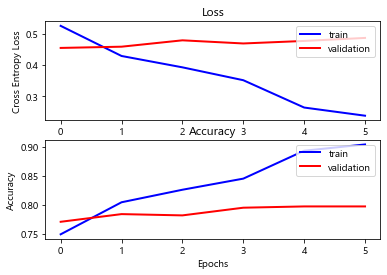

========= Eperiment -  optuna TCN fasttext  =========


Experiencing connection interruptions. Reestablishing communication with Neptune.
Info (NVML): NVML Shared Library Not Found. GPU usage metrics may not be reported. For more information, see https://docs-legacy.neptune.ai/logging-and-managing-experiment-results/logging-experiment-data.html#hardware-consumption 


https://app.neptune.ai/codekcg23/Research-Experiments/e/RES-579
              precision    recall  f1-score   support

           0       0.83      0.90      0.86      1336
           1       0.72      0.58      0.64       604

    accuracy                           0.80      1940
   macro avg       0.77      0.74      0.75      1940
weighted avg       0.79      0.80      0.79      1940

Predicted     0    1
Actual              
0          1201  135
1           253  351


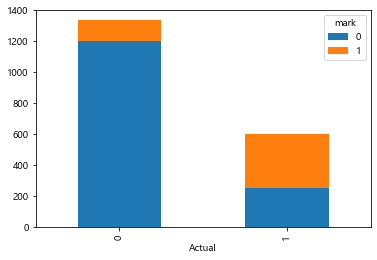

එන්න එන්න දැන් පරක්කු නෑ මුළ ටික හෙට එකෙන් අහමු ඊට පස්සේ ආයම
Predicted Label :  Not Hate  | Turth Label :  Not Hate

ඕකගේ ලාච්චුවේ දාපල්ලා නරුමයා
Predicted Label :  Not Hate  | Turth Label :  Hate

කන්න බොන්න දීලා කරට අත දාගෙන පිටිපස්සෙන් පිහියෙන් අනින සිස්ටම් එක තමයි පර්සි ලග තිබ්බෙ අන්තිමට පර්සි ලග හිටියා සුමනයා පර්සිටත් දුන්නෙ එවැනිම පාරක් තමයි හතර ගාතෙන් ඇදගෙන වැටෙන්න
Predicted Label :  Not Hate  | Turth Label :  Not Hate

කෝටි න් ගියත් ත්‍රී වීල් එකෙන් ගියත් යන්නෙ එකම පාරෙ නෙ බං කවදාහරි දවසක ඕකත් දිරලා වල පල්ලට යනවා කෝටි කින් කරන්න තව වැඩ කොච්චර නම් තියේද
Predicted Label :  Not Hate  | Turth Label :  Hate

ඒකි හිතන් ඇත්තේ අපිට පුපේ ඉත්තෑවෝ දුවනව කියලද දන්නෑ ෆේක් වලින් හරි ගිහින් එව්ව බලන්න
Predicted Label :  Not Hate  | Turth Label :  Hate

මේ තට්ටයව මුණ ගැහිලම විස්තරේ අහගනින් සියනෑවේ සිංහයා කියලා ඡන්දෙට ඉල්ලුවෙ සිංහයෙක් තියා හිවලෙක්වත් වෙන්න බෑ කියලා දැන් ඔප්පු වෙලා තියෙන්නෙ
Predicted Label :  Not Hate  | Turth Label :  Hate

සිවුරක් දමාගැනීම දමිත් අසංක පුක පෙන්වීම පිදුරංගල වීරයෝ

Unexpected error in ping thread.
Traceback (most recent call last):
  File "C:\Users\Kavishka\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 672, in urlopen
    chunked=chunked,
  File "C:\Users\Kavishka\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 421, in _make_request
    six.raise_from(e, None)
  File "<string>", line 3, in raise_from
  File "C:\Users\Kavishka\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 416, in _make_request
    httplib_response = conn.getresponse()
  File "C:\Users\Kavishka\anaconda3\lib\http\client.py", line 1344, in getresponse
    response.begin()
  File "C:\Users\Kavishka\anaconda3\lib\http\client.py", line 306, in begin
    version, status, reason = self._read_status()
  File "C:\Users\Kavishka\anaconda3\lib\http\client.py", line 267, in _read_status
    line = str(self.fp.readline(_MAXLINE + 1), "iso-8859-1")
  File "C:\Users\Kavishka\anaconda3\lib\socket.py", line 589, in readinto
    return self._sock.recv_into

In [5]:

Y_pred = TC.model_evaluate(tcn_model,hist)
TC.save_predictions(Y_pred,TC.tag)

##### word2vec skipgram
 layers: 1
    units: 128
    dropout_rates: 0.2
    kernel_size: 3
    activation: swish
    spatial_dropout: True
    LR: 0.001

In [ ]:
TC_W = TextClassifier.TextClassifier(EMBEDDING='w2v_skipgram')

In [26]:

TC.EPOCHS =50
TC.BATCH_SIZE =16
TC.lr = 0.001
TC.tag = "optuna TCN w2v sg"
TC.activation = 'swish'
kernel_size = 3
TC.unit =128
TC.dropout_rate = 0.2
tcn_wv_sg = tcn_model(TC,kernel_size=3,spatial_dropout=True)
tcn_wv_sg, hist = TC.train_model(tcn_wv_sg)

Model: "model_52"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_53 (InputLayer)           [(None, 100)]        0                                            
__________________________________________________________________________________________________
embedding_52 (Embedding)        (None, 100, 300)     6000000     input_53[0][0]                   
__________________________________________________________________________________________________
spatial_dropout1d_481 (SpatialD (None, 100, 300)     0           embedding_52[0][0]               
__________________________________________________________________________________________________
tcn1 (TCN)                      (None, 100, 128)     400256      spatial_dropout1d_481[0][0]      
___________________________________________________________________________________________

train loss -  0.23458913743653972  train acc-  0.9131684
test loss -  0.3776567754057265  test acc-  0.8505155
Train acc: 0.913, Test acc: 0.851


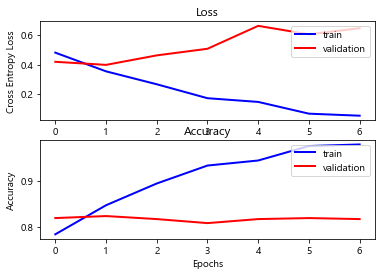

========= Eperiment -  optuna TCN w2v sg  =========
https://app.neptune.ai/codekcg23/Research-Experiments/e/RES-576
              precision    recall  f1-score   support

           0       0.86      0.93      0.90      1336
           1       0.82      0.67      0.74       604

    accuracy                           0.85      1940
   macro avg       0.84      0.80      0.82      1940
weighted avg       0.85      0.85      0.85      1940

Predicted     0    1
Actual              
0          1246   90
1           200  404


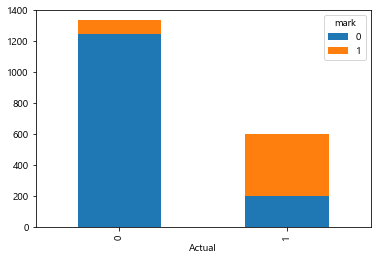

එන්න එන්න දැන් පරක්කු නෑ මුළ ටික හෙට එකෙන් අහමු ඊට පස්සේ ආයම
Predicted Label :  Not Hate  | Turth Label :  Not Hate

ඕකගේ ලාච්චුවේ දාපල්ලා නරුමයා
Predicted Label :  Hate  | Turth Label :  Hate

කන්න බොන්න දීලා කරට අත දාගෙන පිටිපස්සෙන් පිහියෙන් අනින සිස්ටම් එක තමයි පර්සි ලග තිබ්බෙ අන්තිමට පර්සි ලග හිටියා සුමනයා පර්සිටත් දුන්නෙ එවැනිම පාරක් තමයි හතර ගාතෙන් ඇදගෙන වැටෙන්න
Predicted Label :  Not Hate  | Turth Label :  Not Hate

කෝටි න් ගියත් ත්‍රී වීල් එකෙන් ගියත් යන්නෙ එකම පාරෙ නෙ බං කවදාහරි දවසක ඕකත් දිරලා වල පල්ලට යනවා කෝටි කින් කරන්න තව වැඩ කොච්චර නම් තියේද
Predicted Label :  Not Hate  | Turth Label :  Hate

ඒකි හිතන් ඇත්තේ අපිට පුපේ ඉත්තෑවෝ දුවනව කියලද දන්නෑ ෆේක් වලින් හරි ගිහින් එව්ව බලන්න
Predicted Label :  Not Hate  | Turth Label :  Hate

මේ තට්ටයව මුණ ගැහිලම විස්තරේ අහගනින් සියනෑවේ සිංහයා කියලා ඡන්දෙට ඉල්ලුවෙ සිංහයෙක් තියා හිවලෙක්වත් වෙන්න බෑ කියලා දැන් ඔප්පු වෙලා තියෙන්නෙ
Predicted Label :  Not Hate  | Turth Label :  Hate

සිවුරක් දමාගැනීම දමිත් අසංක පුක පෙන්වීම පිදුරංගල වීරයෝ සෙට

In [27]:

Y_pred = TC.model_evaluate(tcn_wv_sg,hist)
TC.save_predictions(Y_pred,TC.tag)

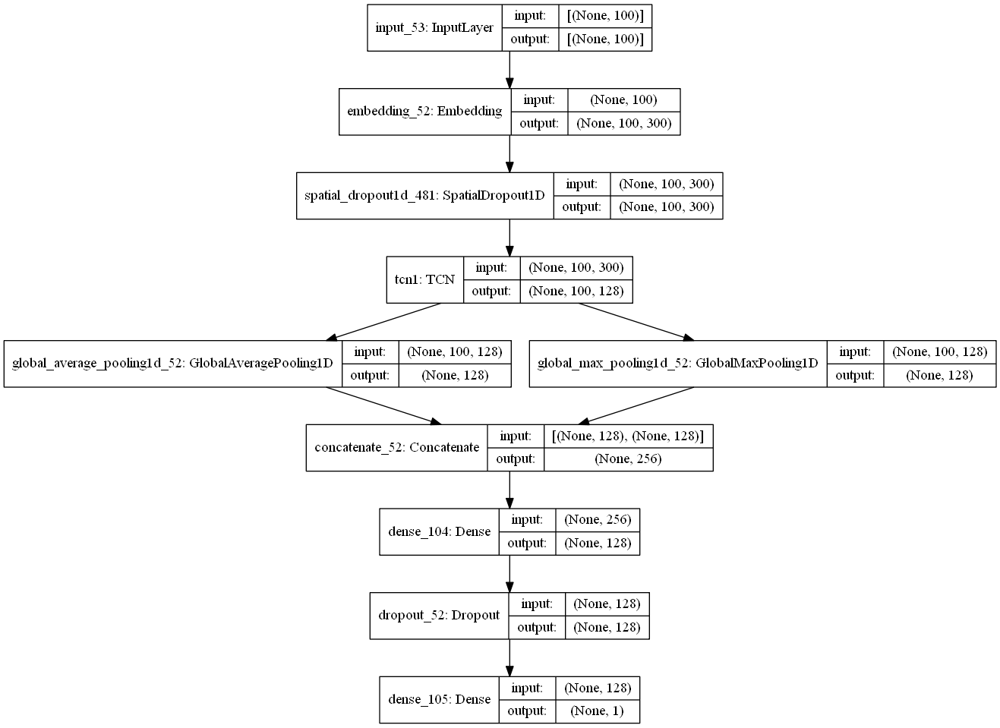

In [29]:
from keras.utils.vis_utils import plot_model
plot_model(tcn_wv_sg, to_file='tcn_wv_model_plot.png', show_shapes=True, show_layer_names=True)

In [28]:
error_analysis(TC,tcn_wv_sg,Y_pred)




කෝටි න් ගියත් ත්‍රී වීල් එකෙන් ගියත් යන්නෙ එකම පාරෙ නෙ බං කවදාහරි දවසක ඕකත් දිරලා වල පල්ලට යනවා කෝටි කින් කරන්න තව වැඩ කොච්චර නම් තියේද
Predicted Label :  Not Hate  | Turth Label :  Hate


None


ඒකි හිතන් ඇත්තේ අපිට පුපේ ඉත්තෑවෝ දුවනව කියලද දන්නෑ ෆේක් වලින් හරි ගිහින් එව්ව බලන්න
Predicted Label :  Not Hate  | Turth Label :  Hate


None


මේ තට්ටයව මුණ ගැහිලම විස්තරේ අහගනින් සියනෑවේ සිංහයා කියලා ඡන්දෙට ඉල්ලුවෙ සිංහයෙක් තියා හිවලෙක්වත් වෙන්න බෑ කියලා දැන් ඔප්පු වෙලා තියෙන්නෙ
Predicted Label :  Not Hate  | Turth Label :  Hate


None


සිවුරක් දමාගැනීම දමිත් අසංක පුක පෙන්වීම පිදුරංගල වීරයෝ සෙට් එකම එකම සෙල් එකට සෙට් උනොත් සිංදු කිය කිය පුක පෙන්නතැකි
Predicted Label :  Hate  | Turth Label :  Not Hate


None








ලොරි ඩ්‍රයිවර්ලා ඔක්කොම ඔහොම මෝඩ වැඩ තමය් කරන්නේ ඒගොල්ලන් ඉගනගැන නැති හින්ද නේ ඩ්‍රයිවර් කෙනෙක් වෙන්නේ
Predicted Label :  Not Hate  | Turth Label :  Hate


None





මේවට හිනා වෙන්න ඕනෙ යකෝ අධෝ මුඛයෙන් මේ වගේ නාකියෙක් බැදගෙන මදිවට මේකි කියන පුරසාරම් ඇහුවම අපි කුඩු ගහලද නැත්තං මේකි කුඩු ගහලද කියලා හිතෙනවා
Predicted Label :  Not Hate  | Turth Label :  Hate


None

##### word2vec cbow

 layers: 1
    units: 128
    dropout_rates: 0.2
    kernel_size: 3
    activation: swish
    spatial_dropout: True
    LR: 0.001

In [4]:
TC = TextClassifier.TextClassifier(EMBEDDING='w2v_cbow')

Load data

X train (4526,) Y train (4526,) X test (1940,) Y test (1940,)
Build vocab

Load Embedding model

Create embedding index

found 2137729 word vectors
Check coverage
Found embeddings for 93.59% of vocab
Found embeddings for  98.12% of all text
Added 489 words to embedding with longer suffix
Added 29 words to embedding with shorter suffix
2138247
Check coverage
Found embeddings for 96.54% of vocab
Found embeddings for  99.00% of all text
dictionary size:  17577
Embedding matrix 



In [5]:

TC.EPOCHS =50
TC.BATCH_SIZE =16
TC.lr = 0.001
TC.tag = "optuna TCN w2v cbow"
TC.activation = 'swish'
kernel_size = 3
TC.unit =128
TC.layer = 1
TC.dropout_rate = 0.2
tcn_wv_cbow = tcn_model(TC,kernel_size=3,spatial_dropout=True)
tcn_wv_cbow, hist = TC.train_model(tcn_wv_cbow)

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 100)]        0                                            
__________________________________________________________________________________________________
embedding (Embedding)           (None, 100, 300)     6000000     input_1[0][0]                    
__________________________________________________________________________________________________
spatial_dropout1d (SpatialDropo (None, 100, 300)     0           embedding[0][0]                  
__________________________________________________________________________________________________
tcn1 (TCN)                      (None, 100, 128)     400256      spatial_dr

train loss -  0.3260187135167318  train acc-  0.87825894
test loss -  0.44042038180164456  test acc-  0.80360824
Train acc: 0.878, Test acc: 0.804


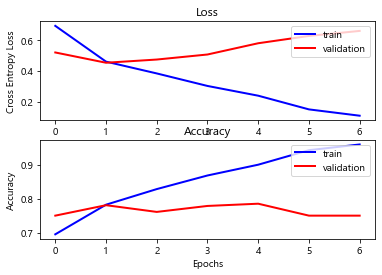

========= Eperiment -  optuna TCN w2v cbow  =========


Info (NVML): NVML Shared Library Not Found. GPU usage metrics may not be reported. For more information, see https://docs-legacy.neptune.ai/logging-and-managing-experiment-results/logging-experiment-data.html#hardware-consumption 


https://app.neptune.ai/codekcg23/Research-Experiments/e/RES-578
              precision    recall  f1-score   support

           0       0.81      0.93      0.87      1336
           1       0.76      0.53      0.63       604

    accuracy                           0.80      1940
   macro avg       0.79      0.73      0.75      1940
weighted avg       0.80      0.80      0.79      1940

Predicted     0    1
Actual              
0          1236  100
1           281  323


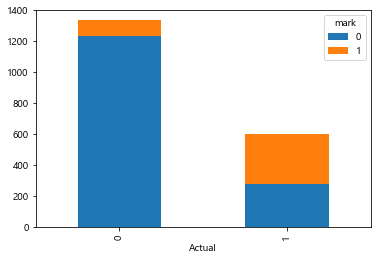

එන්න එන්න දැන් පරක්කු නෑ මුළ ටික හෙට එකෙන් අහමු ඊට පස්සේ ආයම
Predicted Label :  Not Hate  | Turth Label :  Not Hate

ඕකගේ ලාච්චුවේ දාපල්ලා නරුමයා
Predicted Label :  Not Hate  | Turth Label :  Hate

කන්න බොන්න දීලා කරට අත දාගෙන පිටිපස්සෙන් පිහියෙන් අනින සිස්ටම් එක තමයි පර්සි ලග තිබ්බෙ අන්තිමට පර්සි ලග හිටියා සුමනයා පර්සිටත් දුන්නෙ එවැනිම පාරක් තමයි හතර ගාතෙන් ඇදගෙන වැටෙන්න
Predicted Label :  Hate  | Turth Label :  Not Hate

කෝටි න් ගියත් ත්‍රී වීල් එකෙන් ගියත් යන්නෙ එකම පාරෙ නෙ බං කවදාහරි දවසක ඕකත් දිරලා වල පල්ලට යනවා කෝටි කින් කරන්න තව වැඩ කොච්චර නම් තියේද
Predicted Label :  Not Hate  | Turth Label :  Hate

ඒකි හිතන් ඇත්තේ අපිට පුපේ ඉත්තෑවෝ දුවනව කියලද දන්නෑ ෆේක් වලින් හරි ගිහින් එව්ව බලන්න
Predicted Label :  Not Hate  | Turth Label :  Hate

මේ තට්ටයව මුණ ගැහිලම විස්තරේ අහගනින් සියනෑවේ සිංහයා කියලා ඡන්දෙට ඉල්ලුවෙ සිංහයෙක් තියා හිවලෙක්වත් වෙන්න බෑ කියලා දැන් ඔප්පු වෙලා තියෙන්නෙ
Predicted Label :  Not Hate  | Turth Label :  Hate

සිවුරක් දමාගැනීම දමිත් අසංක පුක පෙන්වීම පිදුරංගල වීරයෝ සෙට

In [6]:

Y_pred = TC.model_evaluate(tcn_wv_cbow,hist)
TC.save_predictions(Y_pred,TC.tag)

##### Random embedding
Best trial:
  Value:  0.4422325072830613
  Params: 
    layers: 1
    units: 128
    dropout_rates: 0.1
    kernel_size: 3
    activation: swish
    spatial_dropout: False
    LR: 0.001

In [5]:
TC = TextClassifier.TextClassifier(EMBEDDING=None)

Load data

X train (4526,) Y train (4526,) X test (1940,) Y test (1940,)
dictionary size:  17577


In [6]:

TC.EPOCHS =50
TC.BATCH_SIZE =16
TC.lr = 0.001
TC.tag = "optuna TCN rand"
TC.activation = 'swish'
kernel_size = 3
TC.unit =128
TC.trainable=True
TC.layer = 1
TC.dropout_rate = 0.1
tcn_rand = tcn_model(TC,kernel_size=3,spatial_dropout=False)
tcn_rand, hist = TC.train_model(tcn_rand)

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 100)]        0                                            
__________________________________________________________________________________________________
embedding (Embedding)           (None, 100, 300)     6000000     input_1[0][0]                    
__________________________________________________________________________________________________
tcn1 (TCN)                      (None, 100, 128)     400256      embedding[0][0]                  
__________________________________________________________________________________________________
global_average_pooling1d (Globa (None, 128)          0           tcn1[0][0]

train loss -  0.2812005374555929  train acc-  0.89726025
test loss -  0.41470789728090934  test acc-  0.82628864
Train acc: 0.897, Test acc: 0.826


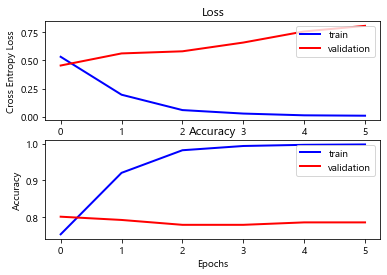

========= Eperiment -  optuna TCN rand  =========


Info (NVML): NVML Shared Library Not Found. GPU usage metrics may not be reported. For more information, see https://docs-legacy.neptune.ai/logging-and-managing-experiment-results/logging-experiment-data.html#hardware-consumption 


https://app.neptune.ai/codekcg23/Research-Experiments/e/RES-577
              precision    recall  f1-score   support

           0       0.84      0.93      0.88      1336
           1       0.79      0.60      0.68       604

    accuracy                           0.83      1940
   macro avg       0.81      0.77      0.78      1940
weighted avg       0.82      0.83      0.82      1940

Predicted     0    1
Actual              
0          1239   97
1           240  364


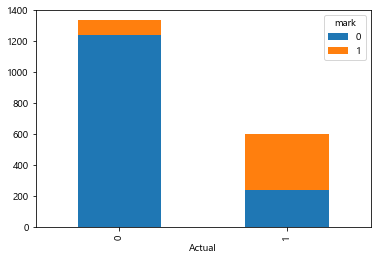

එන්න එන්න දැන් පරක්කු නෑ මුළ ටික හෙට එකෙන් අහමු ඊට පස්සේ ආයම
Predicted Label :  Not Hate  | Turth Label :  Not Hate

ඕකගේ ලාච්චුවේ දාපල්ලා නරුමයා
Predicted Label :  Not Hate  | Turth Label :  Hate

කන්න බොන්න දීලා කරට අත දාගෙන පිටිපස්සෙන් පිහියෙන් අනින සිස්ටම් එක තමයි පර්සි ලග තිබ්බෙ අන්තිමට පර්සි ලග හිටියා සුමනයා පර්සිටත් දුන්නෙ එවැනිම පාරක් තමයි හතර ගාතෙන් ඇදගෙන වැටෙන්න
Predicted Label :  Hate  | Turth Label :  Not Hate

කෝටි න් ගියත් ත්‍රී වීල් එකෙන් ගියත් යන්නෙ එකම පාරෙ නෙ බං කවදාහරි දවසක ඕකත් දිරලා වල පල්ලට යනවා කෝටි කින් කරන්න තව වැඩ කොච්චර නම් තියේද
Predicted Label :  Not Hate  | Turth Label :  Hate

ඒකි හිතන් ඇත්තේ අපිට පුපේ ඉත්තෑවෝ දුවනව කියලද දන්නෑ ෆේක් වලින් හරි ගිහින් එව්ව බලන්න
Predicted Label :  Not Hate  | Turth Label :  Hate

මේ තට්ටයව මුණ ගැහිලම විස්තරේ අහගනින් සියනෑවේ සිංහයා කියලා ඡන්දෙට ඉල්ලුවෙ සිංහයෙක් තියා හිවලෙක්වත් වෙන්න බෑ කියලා දැන් ඔප්පු වෙලා තියෙන්නෙ
Predicted Label :  Hate  | Turth Label :  Hate

සිවුරක් දමාගැනීම දමිත් අසංක පුක පෙන්වීම පිදුරංගල වීරයෝ සෙට් එක

In [7]:

Y_pred = TC.model_evaluate(tcn_rand,hist)
TC.save_predictions(Y_pred,TC.tag)

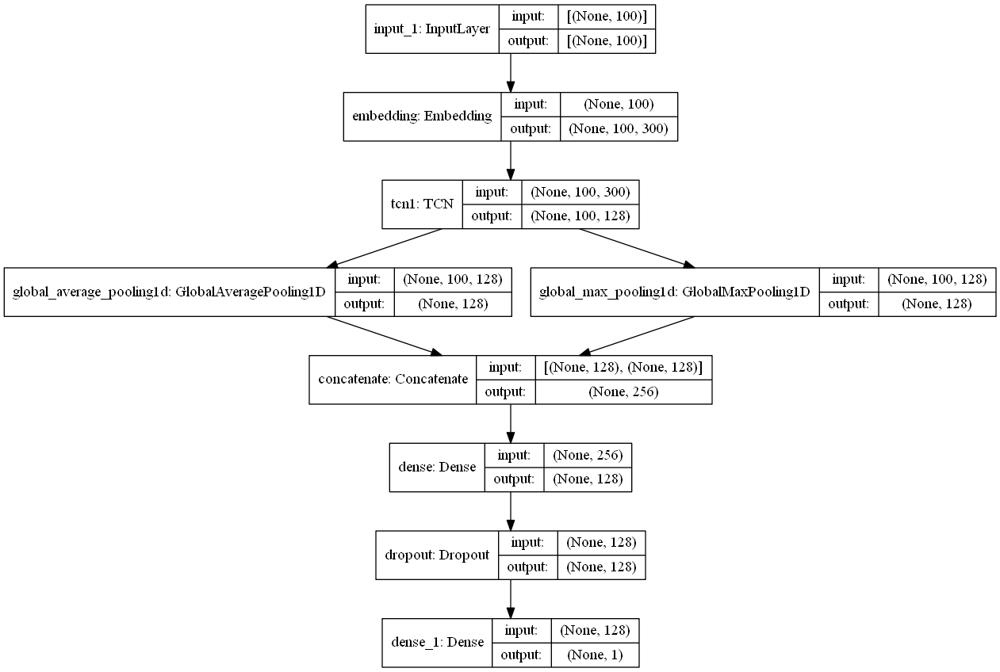

In [8]:
from keras.utils.vis_utils import plot_model
plot_model(tcn_rand, to_file='tcn_rand_model_plot.png', show_shapes=True, show_layer_names=True)